# Project Name : Covid-19 tweets sentiment analysis
**Author:Nilufa Yeasmin**

In [25]:
#Importing all necessary libries
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
from textblob import TextBlob

In [26]:
#loading dataset
data=pd.read_csv('main_dataset.csv',index_col=0,encoding='latin1')

In [27]:
data.head()

,user_id,screen_name,text
5,15872418.0,ABSCBNNews,G20 agrees to debt relief for poorest countrie...
7,171548670.0,RadioNLNews,B.C. health officials are urging people to kin...
9,23517017.0,953WDAE,The Lovely Lisa Ann Joins The Show LIVE From N...
10,613510703.0,matanock,@allisonnamias @ArriolaLR As @ethanbdm referen...
11,38489678.0,JAMA_current,Study suggests higher rates of co-infection be...


In [28]:
data.shape

(357526, 3)

**For sentiment analysis we only need text columns so we will drop the other columns**

In [29]:
#droping all columns except text column
df=data.drop(['user_id','screen_name'], axis = 1) 

In [30]:
df.head()

,text
5,G20 agrees to debt relief for poorest countrie...
7,B.C. health officials are urging people to kin...
9,The Lovely Lisa Ann Joins The Show LIVE From N...
10,@allisonnamias @ArriolaLR As @ethanbdm referen...
11,Study suggests higher rates of co-infection be...


**Index is not in sequence(5-7) order so we need to reset the index**

In [31]:
#reset the index
df.reset_index(inplace = True) 

In [32]:
df.drop(['index'],axis=1,inplace=True)

In [33]:
df.head()

,text
0,G20 agrees to debt relief for poorest countrie...
1,B.C. health officials are urging people to kin...
2,The Lovely Lisa Ann Joins The Show LIVE From N...
3,@allisonnamias @ArriolaLR As @ethanbdm referen...
4,Study suggests higher rates of co-infection be...


In [34]:
df.shape

(357526, 1)

# **It has around 357k rows .For quick analysis we will take first 150k rows**  

In [35]:
clean_data=df.iloc[:150000,:]

In [36]:
clean_data

,text
0,G20 agrees to debt relief for poorest countrie...
1,B.C. health officials are urging people to kin...
2,The Lovely Lisa Ann Joins The Show LIVE From N...
3,@allisonnamias @ArriolaLR As @ethanbdm referen...
4,Study suggests higher rates of co-infection be...
...,...
149995,'We're all in this together.' \n\nRoyal Papwor...
149996,@Scuddsy67 @MPMarilynGladu So a coward.... got...
149997,Join us tonight for #TheSupernaturalHour prog ...
149998,Happy National (virtual) High Five Day! \n#nat...


In [37]:
clean_data.shape

(150000, 1)

# Text cleaning using regular exp

In [38]:
#Clean text
#function for cleaning text
def cleanText(text):
    text=re.sub(r'@[A-Za-z0-9]+','',text) 
    text=re.sub(r'#','',text)
    text=re.sub(r'RT[\s]+','',text)
    text=re.sub(r'https?:\/\/\S+','',text)
    
    return text

clean_data['text']=clean_data['text'].apply(cleanText)

<ipython-input-38-fef029b13011>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_data['text']=clean_data['text'].apply(cleanText)


In [39]:
clean_data

,text
0,G20 agrees to debt relief for poorest countrie...
1,B.C. health officials are urging people to kin...
2,The Lovely Lisa Ann Joins The Show LIVE From N...
3,"As referenced, just saw this op-ed version ..."
4,Study suggests higher rates of co-infection be...
...,...
149995,'We're all in this together.' \n\nRoyal Papwor...
149996,So a coward.... got it!\n\nHappy to sit behi...
149997,Join us tonight for TheSupernaturalHour prog o...
149998,Happy National (virtual) High Five Day! \nnati...


# Finding subjectivity and polarity

In [40]:
# Create a function to get subjectivity

def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#create two new ccolumns

clean_data['Subjectivity']=clean_data['text'].apply(getSubjectivity)
clean_data['Polarity']=clean_data['text'].apply(getPolarity)

<ipython-input-40-2fe737863854>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_data['Subjectivity']=clean_data['text'].apply(getSubjectivity)
<ipython-input-40-2fe737863854>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_data['Polarity']=clean_data['text'].apply(getPolarity)


In [41]:
clean_data.head()

,text,Subjectivity,Polarity
0,G20 agrees to debt relief for poorest countrie...,0.000000,0.000000
1,B.C. health officials are urging people to kin...,0.900000,0.600000
2,The Lovely Lisa Ann Joins The Show LIVE From N...,0.625000,0.356534
3,"As referenced, just saw this op-ed version ...",0.000000,0.000000
4,Study suggests higher rates of co-infection be...,0.347222,-0.013889


In [42]:
from wordcloud import WordCloud

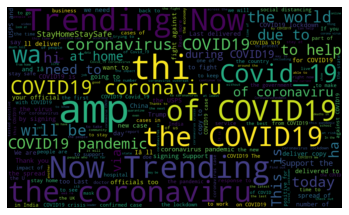

In [43]:
#Ploting Word cloud
allWords=''.join([twts for twts in clean_data['text']])
wordCloud=WordCloud(width=1000,height=600,random_state=21,max_font_size=119).generate(allWords)
plt.imshow(wordCloud,interpolation='bilinear')
plt.axis('off')
plt.show()

## Finding Negetive , Neutral and Positive Sentiment

In [44]:
# Create function to compute the negative ,neutral and positive analysis
def getAnalysis(score):
    if score <0:
        return 'Negative'
    elif score ==0:
        return 'Neutral'
    else:
        return 'Positive'
clean_data['Analysis']=clean_data['Polarity'].apply(getAnalysis)
    

<ipython-input-44-42bb92368464>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_data['Analysis']=clean_data['Polarity'].apply(getAnalysis)


In [45]:
clean_data.head()

,text,Subjectivity,Polarity,Analysis
0,G20 agrees to debt relief for poorest countrie...,0.000000,0.000000,Neutral
1,B.C. health officials are urging people to kin...,0.900000,0.600000,Positive
2,The Lovely Lisa Ann Joins The Show LIVE From N...,0.625000,0.356534,Positive
3,"As referenced, just saw this op-ed version ...",0.000000,0.000000,Neutral
4,Study suggests higher rates of co-infection be...,0.347222,-0.013889,Negative


In [46]:
# printing all positie tweets

j=1
sortedDF=clean_data.sort_values(by=['Polarity'])
for i in range(0,sortedDF.shape[0]):
    if(sortedDF['Analysis'][i]=='Positive'):
        print(str(j) + '.' + sortedDF['text'][i])
        print()
        j=j+i

1.B.C. health officials are urging people to kind and not jump to conclusions about travellers amid the COVID19 pandemic. Shuswap kamloops  

2.The Lovely Lisa Ann Joins The Show LIVE From NYC!! -  

   

NFL MLB COVID19 Coronavirus 

LISTEN 


4.Gabriel Leung and colleagues from Hong Kong describe their actions after they were first alerted to a cluster of atypical pneumonia cases in Wuhan. A figure shows the evolution of the epidemic and the responses to date in Hong Kong. COVID19 SARSCoV2

9.Belarusian President Lukashenka, fresh out of a hockey game, to a reporter: "There are no viruses here. Did you see any of them flying around?" covid19 

Yet throughout April, the number of officially confirmed cases has roughly doubled every three days.  

17.Weâre all Al Tarazon this spring. âI just feel sad,â said the Oxnard High baseball coach. âI can't help it.â covid19 baseball
 via 

28.Today's COVID19 update discusses how to care for health care workers on the front lines of th

161130.How ArtificialIntelligence identified the First Warnings of the Coronavirus  

161949..  and @_Riskpulse  offer free dashboard guide to Covid19 disruptions  coronavirus supplychain logistics 

162769.Attention small businesses impacted by COVID19: the  has teamed up with  on a new SaveSmallBusiness grant fund. Every dollar counts. Learn more about how this $5,000 grant program can help meet short-term business needs at 

163591.Crisis squeezes out what is inside of us. Iâm try to stay positive, be creative, and come out of this better. COVID19  lockdown QuarentineLife Canada CanadaCovid19 canadalockdown NewBrunswick 

164420.InThisTogether Honored to have voiced this powerful message from   _Faulconer FirstResponders COVID19 

165250."The analysis by the JCT showed just how skewed the tax provision benefits the wealthy. ItÂ foundÂ that, '82 percent of the benefits of the policy go to about 43,000 taxpayers who earn more than $1 million annually.'"

stimuluspayment COVID19

Sto


1177450. MyBreathingPracticeði place tongue on RoofOfMouth 
Inhale thru nose 
Exhale thru nose
repeat nosebreathing  SlowDown Mindful 
iAVOID mouthbreathing Stress PracticePatience  
ProtectPatients healthworkers EachOther"Â©cl COVID19 CALM w

1179730.    2,500 people will have died today

The Covid_19 death toll is nearly 5X what it was 2 weeks ago

Meanwhile, Trump's flailing around blame-shifting. FU 

1182013.Same as yesterday, 20 counties reported new positive tests for COVID19. The lowest amount in the past week was 19 counties reporting on Monday. 

1184298.Out of 1,495 test results reported today, 11.1% returned positive for the coronavirus. This breaks a six-day streak of less than 10% of daily test results returning positive. 

1186585.12 WI counties have gone a week or more since they last reported a new known coronavirus infection. Among them, Wood County hasn't seen a new confirmed case in 19 days, Pierce County in 15 days, and Bayfield and Menominee Counties haven't s

2164802.Equity must be prioritized in the 4th Coronavirus stimulus package. This includes increasing funding for minority-serving institutions, under resourced students, and services to support studentsâ social and emotional needs. 
Check out our take here: 

2167847. confirm an officer has tested positive for COVID19 They say due to his assignment, he had no interaction with the public. Coronavirus 



2170894.That's Right, The Lord Jesus Christ Has Purchased Everything You Are &amp; Everything Which Belongs To You!

We Are Not Our Own, So Rejecting What The Lord Jesus Has Done For You, Has Very Huge Consequences!

Worse Than What We Are Seeing With The CoronavirusPandemic, COVID19! 

2173947.MonashPolicyMatters K. McCann: the challenges facing Directors and Boards during COVID19 are far greater than during the GFC.  

2177003..   The more pollution we unleash into our air, the more Americansâ health remains at risk. As we work to rebuild from the COVID19 crisis, please make sure 

4269319.Over 10.2 lakh Refunds worth Rs 4,250 crore issued in a week by CBDT to help taxpayers in COVID-19 pandemic situation

Read more at 

Share and spread knowledge
CBDT IncomeTax incometaxindia CoronavirusLockdown Covid_19 Lockdown2

4273573.How many people know the purpose of wearing a face-mask during COVID19 crisis? ð·

4277829.The cupboards were NOT bare.   destroyed the cupboards and has the audacity to blame the past administration    trump is the most dangerous person on the earth more than the CoronavirusPandemic 

4282093.Community finds unique ways to support  during COVID19 | STORY:  Kamloops 

4286360.Ecclesiastes1:9 New International Version (NIV)âthere is nothing new under the sunâ. What has been will be again, what has been done will be done again;
9/12
ProgressiveParty
TogetherWeCanFixBrokenSystem
NotMeUs


Evangelicals
COVID19
VotingRights

4290628.Immune thrombocytopenia with lower-extremity purpura, mucosal bleeding, and cerebral microhemorrhage developed 

7575926.If anything, the COVID19 Canadian response/adjustments will be proof of democracy, and role MPs and constituents, and SMEs, can play. Their voice does matter.  Together they keep our communities cdnecon strong. Hopefully we can keep going with this, in newnormal cdnpoli

7581606.This is real. This is life. This is the USA. WHAT THE CUSS. COVID19 healthworkers 

7587289. YOU ROCK!! Thank you for taking care of the most vulnerable and most compromised! And sharing your experience and the experience of your colleagues today! frontline covid19 football md lifelessons

7592973.DrLepervancheCampus. We are going to complete Spring term adjusting our content from GlobalManagementAtSea to current impact of Coronavirus2020 COVID19 in industries, products, services, and workforce. We areâ¦ 

7598659.Can I challenge  to a match and all proceeds go to Covid_19 ... Sounds good to me. AEW

7604347.Congress needs to fulfill it's duties or Adjourn so  can fill his appointments to deal with Cor

The World Doesn't Need The WHO - Gates Wants The WHO for his own profits at the worlds expense. 

10604541.The new social divide: people who can work from home vs those who can't. 

WorkFromHome Covid_19 coronavirus

10611305.   Sir time to adopt Karela models in Maharashtra also to stop the rapid increase of +ve case. Pune and Mumbai need special attention.
Covid_19 
FightAgainstCOVID19

10618071.Governor Little: Iâm extending the stay-at-home order for two more weeks. 

Idaho: Imma make it easier for you.

QuaratineLife StayHomeStaySafe StayHomeSaveLives pandemic2020 

10624839.Flashback to a month ago when I was dying of CV COVID19 but Iâm cool now~ 

10631608.I love Union Strong - New York State AFL-CIO | TWU Hit Hard by COVID-19, let's play it! â¦â© â¦â© â¦â© â¦â© â¦â© â¦â© Covid_19  

10638378. _Odisha _Odisha I know that ,this is not necessary thing in this time. 
I know that the disease can be cured only by social distance.
In my opinion these district which are


10959002.This Pandemic Will Lead to Social Revolutions - Bloomberg

CoronaVirus ClimateEmergency 

Weâre all in this together 

auspol qldpol StopAdani 

ExtinctionRebellion 

TheDrum QandA

SDGs GreenNewDeal

â¦â©

â¦â©  

10965873.Iâm guessing this is more about open border policy than Covid_19 

10972748.The  is hoping to match out of work British Columbians to jobs in shelters and social housing. COVID19 Kamloops  

10979625.The Risks Undocumented Workers Are Facing During the COVID19 Pandemic 

"The coronavirus has at once laid bare the flaws of the immigration and the health-care systems in the United States."

deathpolitics



10986503.CORONAVIRUS QUESTIONS: Many people have been asking about social distancing â what practices work best and why, and how does it apply to hot spots? Dr. Max Gomez has your answers. 

10993382.With COVID-19 doorstep delivery, Reginaâs last milkman picks up new business  COVID19 covid19sk sask

11000264.  I like  more every day. He has i


13058202.Excited share latest addition covid19 AdultMask FREE FILTER shipping Coronavirus CoronavirusPandemic WellnessWednesday WashableMask HealthyAtHomeÂ  StayHomeÂ floridaunemployment ShelterInPlace NYCLockdown pandemic COVIDã¼19 Cloth Unisex SaLe  

13065723.Tomorrow at 2pm CDT join HomeInstead for a FacebookLive to learn tips on how to positively manage your mindset during these challenging times. A positive mindset is crucial to mental &amp; physical health.
Watch â¡ï¸ 
COVID19 

13073245.Join me in helping CoronaVirus victims with Ecoin  ð and earn 600 Ecoins ( worth $3 ) free,  Ecoin the world's fastest-growing crypto will donate 150 Ecoins when you  Sign up. Earn 600 and donate 150 more Ecoins for referring Donatewithoutspending 

13080768.Latest Global COVID19 cases =&gt; 
 Confirmed: 2082822 
 Recovered: 510046 
 Deaths: 134603 
 COVIDCanada COVID2019 StayHome StayHomeCanada

13088293.Innovative idea at a tricky time with CoronavirusOutbreak -  using tents at their  p

 ht

19051991.Pass. No thank. We're more than fine. You all can and will StayHome We're good here in Canada American deniers of the coronavirus are not welcomed. Our borders are closed. cdnpoli 

19061050.Group meetings where people share and support one another is a key aspect of the recovery community at large.

Then the COVID19 pandemic hit, interrupting that fellowship. 

It's not the same, but the recovery community has moved online. COVID19NC 


19070110.RRB, Ministry of Railway extended date of E-Tender for Engaging Exam Conducting Agency (ECA); 

Railways tenders indiatenders proposals skills Skills4All skilldevelopment Skill4Jobs SkillsAtHome coronavirusindia COVID19 COVID2019 skillreporter

19079171.Latest update on COVID19 for our area (with a thorough list of local resources). We seem to be making an impact in reducing our number of cases locally, so let's keep up the good RiskManagement efforts!

Caldwell HerveyBay Queensland insurance COVID19 

19088233."A more accurate a

23404699.., I urge you to cancelstudentdebt in the next coronavirus package. A StudentDebtStimulus will help the 45 million people with student debt and stimulate the economy when it is needed most.

23414709.CoronaVirus can survive high temperature for long period of time. 92 degree celsius temp took 15 min to kill the virus. 


23424721.Me nâ Chis was havin âburgah-cheesesâ. Haha. burgahcheese cheeseburger snack fatherson coronavirus applejuice appajooose lpet89  @ New Jersey 

23434734.Yeah you can barely see the van pulling out, but you can still hear the music. Pandemic ice cream. CovidCones COVID19

23444748.â...neoliberalism is a more advanced form of white supremacy/whitenessâ _andrews - it leaves so many people behind, stripping them of basic human rights and perpetuating the politics of deservedness.  COVID19 SocialJusticeSOS

23454764.A light show represents the new vitality and vitality of Wuhan after the epidemic
TaiwanCanHelp DefundingtheWHO 
 à¸à¸²à¸à¸¡à¸à¹

28222088.The success of the lockdown and people complying with it gives the PM confidence that NZ can make Level 3 work.
All workplaces need to work on a plan and the plan needs to be visible and available to staff. Covid19

28233056. Praying for your family.  You look better and I'm sure Christina will be fine.  Be prepared to spend the rest of the year on the couch for giving her Covid19 âºâºâºð³ð³

28244025.HAHA!! Funny sign spotted at a gas station in the Seattle neighborhood of Wallingford reminding everyone to stop touching your face ð! COVID19 Seattle signofthetimes coronavirus 

28254996.ð¥ð¥ð¥Questionð¥ð¥ð¥

How many times have you washed your hands today? 

WashYourHands &amp; PhysicalDistancing will FlattenTheCurve &amp; SaveLives! Do your part to stop COVID19!

28265973.Heartbroken, but know closing school the rest of the year is the best choice. Covid_19 

28276951.Saving this for a segment, I'm thinking about discussing the battle between liberty vs 

31286499._GT Iâll will hug you after COVID19 ends ...May God keep us safe till then

31298055.Hey , how about some  COVID19 (re)edition? We're all bored in homes, ready to make some epic rock parties, but can't buy full set  anywhere.

31309612.Marginalized folks are more likely to have to live with trauma, COVID19 exacerbates those traumatic experiences because stress triggers it.

31321171.Layyyyy Baaaack... ð¤£ð¤£ð¤£ððð·ð·

goodvibes chrisrenois funny funnymemes tiktok ginandjuice covid_19 coronavirus covid19 stayathome stayhome chill relax lol flattenthecurve socialdistancing quarantine  

31332732.I think it would be a mistake for  to extend stay at home order. Require masks / face coverings, keep large gatherings at minimal but open back up the economy! COVID19

31344294.., I urge you to cancelstudentdebt in the next coronavirus package. A StudentDebtStimulus will help the 45 million people with student debt and stimulate the economy when it is needed most.

313558

36370353.Pretty thankful that I havenât ordered my allotment of uniforms for 2020. After this quarantine and SelfIsolation I will definitely need a bigger size and ð¤ð»the company carries moo mooâs. COVID19 Covid_19 CovidFat CoronavirusLockdown coronavirus coronapocalypse 

36382813.CoronavirusOutbreak | Tripuraâs first Covid-19 patient recovers, sent to quarantine

(Report by )

 

36395275.Lockdown2 was impt, but has made me lazy &amp; isomaniac &amp; hypersomniac with sleep cycle ruined of many, while next day workfromhome. 
Thanks to  for keeping us busy &amp; entertained. LockdownDiaries StayHomeStaySafe   Hope this crisis end soon. netflix COVID19outbreak 

36407738.Iâve been receiving pretty awesome thank youâs from patients and strangers for the past week   Plus a pretty amazing shout-out from my daughter   Thankful Iâm not in the hospital but grateful Im helping so many pregnant women and doing my part â¤ï¸ð· feelingthelove RN COVID19

36420203.  Things wer

44106291.It's a huge slap in the face. The whole process for those needing to enter bank info is a nightmare,  too. Word to wise-use a laptop/desktop! stimuluspayment Covid_19 TrumpIsACompleteFailure 

44119988.Iâm not sure who needs to hear this, but... all the handwashing in the world isnât going to do you much good if SARSCoV2 survives underneath those biga*s nails of yours.

Clip your nails, seriously. Then, WashYourHands. ð§¼ð

COVID19 StayHome LifeInTheTimeOfCorona PSA

44133688.Hereâs the Latest on Hydroxychloroquine and Coronavirus Antivirals  via 
coronavirus antivirals hydroxychloroquine

44147389., this is how unionized "professional educators" respond to COVID19. What a huge contrast to the way health care professionals have responded! But I'll bet you don't get that. Besides, only kids pay the price, not the adults, right? edcolo copol

44161091.CoronavirusOutbreak | Early identification, isolation key to containing Covid-19 cases in Haryana

(Report by )

 

441

49643600.Dm retweetâs and follow if you have any outstanding Bill to Pay I will be the one to help you MAGA2020 MAGA Covid_19 coronavirus AmericaWorksTogether

49658167.The intense physical and mental effort required by health care workers amid COVID-19 via   CoronavirusPandemic   

49672736."Rebounding from an economic disruption this large requires an equally large spike in demand &amp; production. Outside of war, ClimateChange is the only issue large enough to provide such a spike". Covid_19 covid 

49687309.Season 5: Man this season was BORING and the definition of meh!! Sure the last 3 episodes were awesome but so many of the side plots led to nothing and it ended up being a dull season!! Hopeful for season 6!! GameOfThrones Coronavirus 

49701883.Service journalism from the  right here:  COVID19 StayAtHome HaircutAtHome HaircutHeroes

49716459.COVID-19 UPDATE: Mt. Grant General Hospital in Hawthorne reports the first positive test for COVID-19 in Mineral County coronavirus 8NN 

54820551.More Covid19 data. This graphic shows the TOWN totals in the Norfolk, Bristol &amp; Plymouth District. Covid19MA 

54835901.Older woman in parking lot: People don't like to wear their masks around here!

Me: My sunglasses protect me from bitches.

Covid_19
COVID

54851252. Fight for stimulus money for young adults ages of 18-24. Many are living on their own and hurting financially like the rest of Americans.
Donât bailout large corporations while working class students struggle!
Covid19 Coronavirus Stimulu

54866606.Itâs great that the  pledged $5 trillion to the COVID19 economic relief, but at least $1 trillion should be dedicated specifically for developing countries! GiveGenerously SaveLives GenerousCampaign

54881963.This was about people protesting against coronavirus government restrictions and Confederate flag was utilized as an anti establishment symbol by some. Yet on social media has optimistically been turned into a racism issue.

54897321.We won't see economic 

61985161.By Richard Eber

Staying in virtual isolation during the Corona Virus pandemic, much of my time has been spent dealing with âI wish I had a river, I could skate away onâ moments.  Coronavirus(COVID19) mentalhealth RichEber SelfQuarantined  

62001479.I love how the community comes together amongst CoronavirusPandemic. 

62017798.You are doing it RIGHT ON  
coronavirus COVID19 "MICHIGAN: 153 NEW DEATHS IN THE LAST 24 HOURS" -- IT'S NOT OVER YET. ShelterInPlace SocialDistancing

62034119.They say find the positive in all this coronavirus. Here's mine: I am low-key happy  is in quarantine cause otherwise he might be out meeting someone to wife. I'm buying time to figure out how I plan to charm him.ð¤·ð¼ââï¸ð¤ð¼ð¥°

62050442.Hello IG! 
Since its a Thursday, let's throw it back to smw2020 
Where we learnt, had fun and met people. The pre coviÌd19 era. 

This pictures are a reminder of the good time we have shared, and hopes of a goodâ¦ 

62066766.It's Britain's v

Nature, accident, weapon (or business)?

70597440.China: Truth In A Pandemic | 101 East 

101 East investigates the cover-ups and missteps by Chinese authorities that have sparked criticism of the government rarely seen in China. COVID19 coronavirus Covid_19 corruption  

70614860.His home in volatile northwest Syria may have been destroyed, but Hassan Khraiby decided returning was better than risking his 10 children catch the coronavirus in a packed displacement camp.  

70632283.This is how they welcome you home in Naples (Italy) after you recover from covid19 Napoli nonvipermettetedidirenientedinegativograziemilleð 

70649709._Ind trying new drugs and possible new therapies by Cell Culture System for COVID19 
_Ind CSIRFightsCOVID19


70667138.Interesting article . Thoughts?COVID19 WHO 

70684568.Bingo! Toxic Mike decimated Ontario and then scurried away to plumb high paying board positions and corporate gigs. MikeHarris Chartwell COVID19Ontario COVID19 

70702001.Thirty-four new 

27 Deaths ð 

83129477.New Zealand Prime Minister Jacinda Ardern, ministers in her government and public service chief executives take a 20% pay cut for six months due to coronavirus impact  Covid_19

83148411.Buy Now &amp; Pay Later - _FS new Payment Relief Program lets customers acquire new technology now and defer over 90% of the cost to 2021. Learn more
 
heretohelp Flexiblefinancing hpefs itasseteconomics wecanhelp itfinance COVID19 

83167347.IRGC invented a new device that can detect any virus including Covid19 from 100meters! This is the same IRGC that couldn't distinguish a giant civilian airplane from a ballistic missile and crashed it down killing 176 passengers early in January2020! 
Flight752 

83186284.   is the Special Envoy from  Director General on COVID19. He is THE authority. Governments should be following his advice. And it's a great pleasure to have met him.

83205224.Of all the lies  has told during the COVID19 crisis, and heâs told many, the biggest and mos

88881420. Thanks, I wasnât aware of it. But it would be good if all the products bought till may closure should go to the COVID19

88900965.Star Johnsonâs $2,200 Covid_19 stimulus check arrived this week but thatâs not the only good news her family received since we first met last week when the Raleigh single mom was on the brink of homelessness during the pandemic. 
A GoodNews update tonight at 11. abc11 

88920511."Log rozay se nahi, faakay se marr jayege."
Keeping fast will be privilege for people like us but remember  if you eat that one date to break your fast, remember to share it with the poor otherwise the whole point of Ramzan is futile.
lockdown 
coronavirus

88940058.Stay at home ... In practical saying why do government waste money to cure Covid patients especially older ones? They would rather prioritize those productive younger people .. sad but true.. so STAY AT HOME and be safe.
COVID19 
ncov19

88959607.SierraLeone the primary point here is the demonstration of t


97675924.Lighting it up on behalf of  _Thompson   in an amber light parade honouring front line medical workers keeping us safe in  COVID19. Thanks, from myself and the Kamloops-North Thompson! RIH KamloopsBC bcpoli MyBCRoads  

97696432.Thousands of people are dying from COVID19 while world leaders plot &amp; squabble.

We need new Leadership models &amp; guidelines worldwide, truly transformed structures for wielding power &amp; managing human events.

This is unacceptable and untenable, and does not reflect the good 

97716946.How can the government say the rate of infection is going down without testing anyone? Thatâs WELL bizarre!! ð¤ Covid19UK Covid_19

97737462.CoronavirusUSA coronavirus ChinaLiedPeopleDie ChinaLiesPeopleDie 
In light of CCP atrocities against humanity start SUPPORTING freedom for Tibet, and HongKong and Central Asian regions of China, and recognize Taiwan as proper Chinese nation.

97757979.ð´ Trump health officials under increasing pressure to publicly 

Taiwan | Macau | ESCAP | BeyondtheOutbreak | COVID19 |  |

109854181.âWhen Migrants n DisplacedCommunities r excluded from national COVID19 response plans, particularly health care, everyone is at greater risk,â said IOM Director General. 


109875953.This is good news. NZ is a couple of tiny islands. Most rural areas donât have a problem. coronavirus 

109897727.âI had full access,â he says. âI could have changed any vote.â

ExitPolls ShadowInc Acronym Biden Bernie Election2020 Voting COVID19 DemocraticPrimary Iowa SouthCarolina DNC RNC BradParscale Obama DavidPlouffe TaraMcGowan RobbyMook Dems

109919503.In literal terms, you are significantly contributing in saving the world. Stay home. Stay safe.

For order Contact us at +91 8712990029, +91 9393220020
and Order at 

Palamurugrill Restaurant Lockdown covid19 caronavirus safeathome Hyderabad 

109941280.Brought this up tonight during a  virtual meeting. A great marketing campaign done by the folks at  way back in 2015. 

124092531.What a moving tribute to our most appreciated Canadians. COVID19  StayHomeCanada This is my new 1GoodThingToday 

124115722.19 more Coronavirus positive cases have been reported in Agra. The total number of positive cases in the district rises to 167: Agra District Magistrate Prabhu N Singh 
CoronaVirusUpdate COVID IndiaFightsCorona TV9News

124138915.  This is so political! Last I check appx 152k homeless? How much is that per person? Where this $ come from? Do the math!          COVID19

124162111.19 more Coronavirus positive cases have been reported in Agra. The total number of positive cases in the district rises to 167: Agra District Magistrate Prabhu N Singh
StayHomeSaveLives 
CGNews

124185308.Despite major layoffs due to the pandemic, the latest unemployment figures have shown only the slightest uptick in jobless Australians. 9News COVID19 

124208507.Hi everyone,
Given the strong interest in the training and education sector for anything online. I thought I would sha

136462175.Some suspect China has not been truthful about the scope of the epidemic. â© could not say, in its report, how many people were tested for the coronavirus outside the Guangdong. Chinese journalists investigating the outbreak have gone missing. 

136486552.Nevada COVID19
StayAtHome ððð
MayorGoodman wants to open her restaurant Oscar's Steakhouse 

136510931.People in NE China, are fighting against covid-19. 
Neighbouring province Jilin is sending out PPE. 
Stay strong! 
COVID19 suifenhe 

136535311.ððð 11:11 ððð

Wishing and Praying that this COVID19 Outbreak will END SOON, VERY SOON.

We Surrender Everything To You, O Merciful Lord - all that we have and all that we are because You alone are our Lord and our God. Amen. â¤ï¸â¤ï¸â¤ï¸

136559692.During this time we want to ensure you that we are following the COVID-19 situation attentively. The Health and safety of ourÂ patients and employees is our main priority. UrbanSmiles Coronavirus 

13658

153896558.This is actually a really great compilation of fun stuff to do while at home from â¦â©. Great variety! COVID19  

153922500.CoronaVirusUpdate | South Korea has confirmed 22 more cases of the coronavirus over the past 24 hours, taking the total number of positive cases to 10,613 with 229 deaths.

COVID19 CoronavirusOutbreak 

153948447. Ever tried making your own bread?
EnhancedMovementControlOrderð²ð¾  
StayHomeStaySafe 
TrustNoOneð« 

153974399.Right now, hunger-fighting nonprofit organizations in NewYorkCity need food donations. If you represent a food business in that area and have surplus product to donate, please contact us! We will connect you with our partners in need. 

FRV foodrecovery fighthunger covid19

154000354.Meanwhile, Manitoba, away from the national spotlight, had only two new confirmed cases today COVID19 coronavirus

154026312.The COVID outbreak may have been a mistake, and the virus that causes it may have been discovered long before. These image

167188376.The announcement shows how the economic downturn triggered by the coronavirus response is even affecting some of the richest tech businesses.

Google jobs 

167215388.Check out our dedicated website for COVID-19 
which was built with love by  for India 
COVID19 CoronaUpdatesInIndia
Covid19India
India StayHomeStaySafe
IndiaFightsCorona StayHomeSaveLives StayHome 

167242401.If you love dogs, as well as cute AND funny British men, heâs a great follow on Twitter. Definitely a good distraction from the daily near-death experience of just going outside. Covid_19 StayHome dogsofquarantine dogsduringlockdown 

167269416._daven2   The cases are real in Connecticut the death ð toll is overwhelming  Corona virusâs has no names itâs effective bigotry in USA justice system is corrupted politics laws and bigotry abuse of power from the begin

167296432. The virus that will linger much longer than Covid_19

167323449.Maybe time to talk with your white supremacist relative ... just

183637924.I tweeted _UK asking them to step up funding for  â and they responded! I'm proud UKAid is helping to save lives from COVID19 worldwide. 

183666199.New post: Coronavirus Fears Spark Xenophobia In China Against Africans 

183694475.OMG people.  performance  is amazing. i guarantee they will challenge your idea of what this music or that music is all about. 

the entire show is streaming for free right now. fundraiser for  COVID19 relief.

seriously, watch/listen to this. 

183722753.Coronavirus Shows Importance of Cybersecurity: 3 ETFs to Invest In



   

Cybersecurity Coronavirus COVID19 AI CloudComputing ETFs Cybercrime

183751034.*  USA latest daily  of new Covid19 cases still 88% of peak!! ..

SKorea latest new cases only 3% of peakâ&amp; been very low quite a while! ..

maybe âcause as recently as late March, S.K. TESTING rate was ~ 7X the US ... &amp; STILL testing at a higher rate! (âOur World in Dataâ)

183779319._ I've heard interviews this week with Ameri

 has gone from almost no virtual visits 6 weeks ago to doing more than 2000/day.  Caring for the sick or worried well - without added risk of exposure. This could transform healthcare.

191960191.August 4 is not that far away and we are moving at Snails pace of fighting the coronavirus 

191989137.MadhyaPradesh - 42 new COVID19 cases in Indore, MP tally surges to 980 - Health officials
coronavirus 
 


192018085.Facts laid down by one of the most brilliant, compassionate, amazing women in modern history. Let us not squander this opportunity. Hope Compassion CoronavirusOutbreak NeverGoBack BreneBrown 

192047035.U.S. search for coronavirus treatment is âchaosâ â but new plans are coming - The Washington Post 

192075988. Tampa Bay, FL - still no tests unless symptomatic.  We cannot open up until anyone who wants a test, for any reason, can get a test.  We need tests as ubiquitous as ketchup packets! DictatorTrump COVID19

192104945.Completely get it now! ðð¶ð
Dogs LockDown

210395604.COVID19 is causing major disruptions to the education landscape. Policymakers: what questions do you want answers to right now and after COVID-19?  is listening! Share your thoughts using StartWithYourQs or DM them.  edchat

210425847.Tomorrow at 2pm CDT join HomeInstead for a FacebookLive to learn tips on how to positively manage your mindset during these challenging times. A positive mindset is crucial to mental &amp; physical health.
Watch â¡ï¸ 
COVID19 

210456091.Michigan has more than 28,000 cases of Covid19, the fourth-highest number in the nation, with the third-highest number of deaths -- than 1,900 -- according to Johns Hopkins University. OperationGridlock coronavirus

210486336._medco Tbh I don't think "wave" is the right metaphor...

CoronavirusPandemic feels more like a tsunami â a relentless, unstoppable, destructive force of nature. ð

210516582.Good Morning To You.. yes u!
thursdaymorning Covid_19 

210546831._Dixit @_sabanaqvi Watch this How 's clear 

COVID19  coronavirus MakeChinaPay

229631359.Have Some Fun ~ Motivation In Light of a Pandemic  via  BaylessEnterprises BeingCoreyB BuildinganEmpire Business GodIsGood Blessed CoreyB Entrepreneur FinancialFreedom Motivation Coronavirus Success Truth Money Wealth Pandemic

229662887.Q.3 Do you expect Covid-19 to reduce your international purchases in 2020?

Read the full article: Covid-19 Global Trade Survey â Results
â¸ 

InternationalTrade EUTrade Coronavirus China 

229694416.More than 4,000 of our people are now WorkingFromHome due to COVID19. Our people and our customers are spread across Australia â but a massive $500m behind-the-scenes tech investment is helping us weather the storm. Find out more, on The Hub.

229725946.If you live in the area and ordered from Zomato (or Swiggy) you might want to check with them and then take necessary steps Covid covid19 

229757483.IndiaUnderLockdown: Aramane Nagar ward has been identified as hotspot in Bengaluru. Checkpoints set up at al

237996805.In India CoronaVirus is becoming an IslamicVirus where these organized terror groups are using it as a BioTerror weapon. 

238028874.Thanks to The RealHeroes "StayHome Stay Safe" Covid19 

238060945.Coronavirus News Live Updates: 414 virus deaths, India case count rises to 12,380
Track latest updates here 

238093017.Talks abt  reinstating Captain Crozier to USS Theodore Roosevelt after he showed rare leadership nowadays by putting those who depended on him first. Best news of the week, so far. With Finland increasing funding for   after US decision to suspend. COVID19 Integrity 

238125092. This one should be over pretty quickly. Covid19 Covidiot 

238157168.Pregnant Idaho Falls woman with COVID-19 on road to recovery thanks to hydroxychloroquine and medical workers ððð
 coronavirus COVID19
   

238189246.Karnataka reports 13th COVID19 death. Patient 195, 66 years male from Bangalore found COVID 19 positive died on 15/04/2020 at Victoria Hospital.

238221325.The wom

253991806.Oman reported 97 new coronavirus cases in the past 24 hours, raising the total number of confirmed cases in the country to 910.   

254024904.Minister 
is confident that the state and civic administrations are more than capable of taking care of âhomesickâ migrantlabourers.

CoronavirusLockdown CoronaInMaharashtra CoronavirusOutbreak MigrantsOnTheRoad 



254058005.Shanghai bars have resumed operations amid CoronavirusOutbreak, taking various COVID19 preventive measures. However, a jazz club not only faces a decrease in customers but also lacks foreign performers to keep the shows going. Full video:  

254091107.In Nepal, as many as four districts have started to reel under the scarcity of food supply following the extended government-imposed lockdown amid the coronavirus pandemic. COVID19 CoronavirusOutbreak


254124210.BhavinTurakhia believes that live coffee breaks can help employees spend time with their colleagues. 
Coronavirus Lockdown CoronavirusPandemic Quarantine

267001284.Mates and I having drinks and playing games on Zoom, new streaming style rock paper scissors. Welcome to my nz lockdown2020 covid_19 crazydays this is day ilostcount 

267035236.CoronaVirusUpdates India 

Karanataka: One more death reported.
66 year old man passed away in Bengaluru 
Death toll in the state rise to 13

covidindia 
COVID19

267069190. Thank you so much for responding Susan. I am feeling I canât attend my motherâs funeral because I donât think itâs Covid19 safe. Itâs Jewish orthodox.

267103145. I think photos of the dead bodies laying in refrigerated trucks in NYC would have been a more appropriate image. COVID19

267137101.If this is true it means 547 million globally and between MENA and the rest of Africawakeup  this could hit 88 million falling into poverty ... WAKE UP world  ! coronavirus 

267171060.Soo if thereâs no vaccine, thereâs a possibility weâre gonna be on lockdown for the whole year? COVID19

267205020.In Bihar COVID19 : 
Hotspot

286010695.Iâm so pumped for bin night this evening. What to wear? What to wear? ð¤ Iâm thinking either gloves, mask and jeans, or full on tuxedo. isolationlife Covid_19 Covid_19australia darwinNT binnight

286045856._765        _CRU Where police might have even killed more than COVID19

286081023.The continental part of Southeast Asia could stand a chance against Covid_19 but I'm worried about the islander 
A solution for clean flights is a must for inter-nations aids among ASEAN. Aviation industry must take part in this. Few nations could proceed an OperationAirbridge 

286116191._Mattu This is the ground situation of Kashmir, even SMC employees are being thrashed and beaten. Think what they must be doing with general publicðð. Stayhomestaysafe

286151363.Salute

Nurses of the Raipur AIIMS hospital taking care of a 3-month old child after whose mother tested COVID19 positive.
They are taking care of that child like a mother.

 _mp     _singh  

286186539.Duke-NUS Medical S

312107082.even Bloomberg  GETS IT! While capitalists exploit &amp; PROFIT off of the pandemic like parasites, Working class ppl are uniting, organizing &amp; fighting back to WIN! NeverForget the  &amp;  will pay capitalismIsKillingUs COVID19   

312143786.CoronaVirusUpdate | Lucknow's King George Medical University said that 929 samples were tested yesterday, of which 21 have tested positive for coronavirus.

COVID19 CoronavirusOutbreak Covid19India 

312180491.There is no hope in South Korea. More than half of the citizen's voted current government which already pushed to a communism country. Anti-Americanism and following &amp; support damn China who spread COVID-19 and killing people around the world. COVID19 Election2020 ì´ì  

312217197.Everyone giving TigerKing credit for distracting us from COVID19 but where was the love for this gem tonight? GIMMELOVEJOJI
I had to watch three of his music videos ten more times apiece just to get some theories worked out FOR REAL 

312253906.

329702905.In the deadliest years for influenza some 1,700 people die each day. We average more than 5,000 a day from COVID19 so far this month. Nearly 8,000 died today. More than 1/4 of that was here in the US, which is only 4% of the planet. TrumpVirus

329740646.To register, send ð¸Name ð¸Contact ð¸Category of Participation to âï¸ submit.in

For more info, visit - 

TheVisualHouse WhereVisionariesWork CreateAtHomeByTVH  Covid19 lockdown lockdownextension lockdownfestival 

329778388.contd
Democracy needs a free press. India's press was told by PM to be uncritical of the govt's COVID19 response. (Mrs Gandhi gagged the press during Emergency, was lulled into complacency, paid the price in the elections. Hope history doesn't repeat)

â´ï¸

329816131.Duque is not built for emergencies. I believe there's someone way much better suited to run the  in these times. COVID19ph COVID19 

329853875.So it is not difficult to believe and know that the CCP of China attempted to mitigate 



349103936.When people are scared their true nature is revealed covid19

349142728.Beijing could use the coronavirus-induced economic crisis to go on a buying spree. The U.S. and European governments must restrict the purchasing of distressed companiesâ¦ 

349181521.covidVclimate
Which will have greater impact?
COVID19 ClimateEmergency

349220315.This is really great. ð The words he said are precious . Never seen a actor with this types of kindness. His words touches my heart. Hope, everyone listen to him. ð

Real Deshvakt à¤¸à¤²à¤®à¤¾à¤¨ à¤à¤¾à¤¨ 
SalmanKhan Covid19 



349259110.   You think so LOL? StraightPride parade also looked like a  rally but Trump didn't author homophobia. He most definetly authored the slow and often incompetent public health response to covid_19 pande

349297908.Keep dreaming and working on your ideas during this time because winning is a muss Coronavirus muss end one day. 
  W TheReggaeHub ReggaeMusic ReggaeMusicSweet COVID19 


349336707.Around 4



369744652.  Optics: Inpeaching Trump for making the pandemic worse would distract him from the wonderful job he's doing helping fight the pandemic...

His time will come.

COVID19

369784490.COVID19 Updates
3 new cases of l 
34 new cases of COVID19Nigeria  
18 Lagos
12 in Kano
2 in Katsina
1 in Delta
1 in Niger
407 confirmed cases 
128 Discharged
12 deaths
20 States Affected

TakeResponsibility 
StayAtHome 
Maintain SocialDistancing 
WashYourHands Regularly 

369824335.Coronavirus Outbreak: Warning as COVID-19 Leads to Panic Rise in Deaths at Home.Get the latest update on US coronavirus.
Read more: 
Covid_19 USA usaCoronavirus deaths RiseUp CoronavirusOutbreak CoronavirusOutbreakUSA 

369864184.Gujarat update: 105 new COVID19 positive cases, 3 deaths in the state, total cases 871 total deaths 36 5 on ventilator 766 stable 64 discharged Most of the cases from cluster quarantined areas. Total tests conducted so far 20204, 2971 tests in last 24 hours.

369904034.16.4.2020 update .10AM
T

385972752.Free *Tele-Consultation* For *Neurological Problems* offered by *Dr M A Aleem* Neurologist  Trichy Tamilnadu India during this Lockdown period due to COVID19- News the Trichy The Hindu _hindu on 16.4.2020 

386013443.Covid_19 has taught us;
To Love More
To Appreciate Time
To Appreciate Nature 
Not to mess with Nature 
That Humanity is not Prepared 
To return to Basics

386054136.For thousands of Australians Auslan is their only form of language, relying on it for all their information, including Coronavirus. We've released our new Auslan video at: 



386094830.OH HECK NO!!!

PLEASE SPREAD THE WORD ON THE PROPER METHODS OF THE COVID19 PREVENTION PROCEDURES.
 
WASH YOUR HANDS (DON'T DRINK THE WATER AFTER)

USE AN ALCOHOL BASED HAND SANITIZER

MAINTAIN SOCIAL DISTANCING

COUGH/SNEEZE IN THE CROOK OF YOUR ARM. NOT YOUR HAND. 

386135526.Panicking about an extended lockdown?
It is much more than that. It is to save ourselves and the country, it is the right time to work on oursel

_Bihar 

409286656.The ð°ð¼Ministry of Interior grants visitors of temporary residency a 3 month pardon effective between 1st March and 31st May due to COVID19 circumstances. 

No fines imposed for expired visit visas and residences between the above mentioned time frame.â¤µï¸



409328507.So he's using taxpayersdollars 2 take credit 4 returning our own money, lied about the dangers of CoronavirusOutbreak &amp; put Americans at risk of dying by stealing the taxpayer funded nationalstockpile PPE ballsymotherfucker isn't he? WTG  Stimuluscheck TrumpVirus 

409370361.UN secretary general backs PM Imranâs call for debt relief
ARYNews COVID19



409412216.22 new cases, 18 are from Kashmir and four from Jammu province have been reported in the Union Territory. The four cases that tested positive from Jammu include two doctors, mother of a positive doctor &amp; contact of a woman of Tikri area of Udhampur, who died due to Covid_19 

409454075.COVID19 UPDATE THAILAND 16 APRIL

Thailand 


432289347.What new passions or talents have you discovered during stay-home COVID19 ? Anyone need a personalized coloring page of a fun family memory? I might be addicted to reimagining family memories âºï¸ 

432332399.ð¨ð­ _en   _en  _PoliMi    interesting reading for a turnaround during COVID19 times. ð¨ð­LeadershipDevelopment lifelonglearning Schweizverbinden Swiss 

432375452.We are continuing to deliver a range of essential services for people with significant health compromises such as diabetes, chronic pain, functional impairment, mentalhealth or co-morbid conditions.

For more info, visit  or call 1300 003 224.

COVID19 

432418506.With the outbreak of Covid_19 and trump pulling funds from  isn't it time maybe we had our own AHO as Africa then after that maybe consider a UnitedStatesOfAfrica @_AfricanUnion  AHO 4 Africans by Africans maybe the likes of Uncle Bill will leave us alone

432461561.Just like Trump on his own Covid19 inaction for 3 months. Spreading the bl

456588204.  _Police Yes, you're right. we have to follow the instructions of government, and support to the police. To avoid COVID19 StayHomeIndia stayhomeparbhani stayhomeSelu _Police

456632396.A New World Order With A New Digital ID............?? Covid_19 

456676590.A team of Chinese medical experts on Thursday left for Burkina Faso in Africa to help with the fight against the coronavirus. Invited by the government of Burkina Faso, the 12-member team, mainly from the Tianjin Municipal People's Hospital, departed from Tianjin Municipality. 

456720785.BENILDEANS, BE INFORMED!

Older adults &amp; people with underlying conditions can protect themselves &amp; others by:


CoSBRizal BenildeansBeInformed WHO ProtectYourself Handwashing COVID19 BeatCOVID19 COVID19PH WeHealAsOne AnimoBenildo WeAreBenildo 

456764981.coronavirus COVID19 StayHome StayAtHome WearAMask QuarantineLife Quarantine Japanese 
This is a good way how to wear a mask which doesn't hurt your ear!
Spiderman can protect 



484431025.  You are fooling yourself if you think people are social distancing in the townships /informal settlements. Africa has dense poorest conditions, it has nothing to do with social distancing the fact that we record low rates of death fro

484476528.Being positive is actually a curse. Thanks to Coronavirus for opening our eyes. Covid_19 lockdown coronavirus COVID Covid19India COVIDã¼19

484522032.As many as 107 UK-based Indian diaspora groups in a statement commended the Indian government for the measures it has taken to address the COVID-19 pandemic. They also appealed to the Indian public to follow the government. UKdiaspora coronavirus  

484567537."I want testing to be available across the board in care homes."

Health Secretary  says over 4,000 care home staff have been referred to coronavirus testing - and over 10,000 residents have already been tested. 

KayBurley

 

484613046.Americans still struggling to file for unemployment, think about this:  90% of Canadians ne

508880701.If youâre a charity or voluntary organisation that has been affected by COVID19, then funding support is available. Deadline for applications is 12 noon tomorrow melton meltonmowbray 

508927288.Thank you to our frontliners in the healthcare facilities!We only have respect &amp; gratitude for your selflessness as you fight against COVID19 for us. You all are our heroes.

thankyoufrontliners doctors nurses labtechnicians hospitalstaff UAE insuranceUAE broker success 

508973876.Influenza kills more than 1000 people each year in Australia and it seems that many lives will be saved this year in Australia not only by avoiding COVID19 to rip through but also by benefiting from the lockdown measures to avoid a severe 2020 influenza season!!!

509020465.Googleâs latest doodle is a thank you note to all food service workers 

GoogleDoodle COVID19



509067056.Playing PokÃ©mon Silver and drinking more beers than I should. Add 30 extra mins of cardio to tomorrowâs work out. But t

542408233.Heyo! At 12:45 PM PST I'll be doing a stream for Direct Relief for COVID 19. I'll be drawing for donations! You can join me here  You can donate here too 

COVID2019 Covid_19

542456225.Ways to improve sales during covid times
Neodove covid19 entrepreneurship saas marketinghacks service business tech saleshacks growth digitalsolutions productivity leadgen NeoDoveTech effective
 

542504221.RuleofLaw : General Affairs Council could discuss most controversial national emergency measures on 22 April covid19


542552220.The importance of listening to customers during COVID19 â and acting effectively and quickly on their insight. Here are 3 ways to change your VoC program in latest Eptica blog post CX customerexperience: 

542600221.With all due respect, as you said War is ON against Covid_19 how can we fight with relaxation &amp; ease against an unseen enemy?We need to be more vigilant,careful &amp; equipped rather than exposing our selves Infront of unseen deadly enemy in a sh

569086763.coronavirus escapism:  digging into Scottish social housing history.  Really looking forward to this bookâs publication: SeÃ¡n Damer, Scheming: A Social History of Glasgow Council Housing, 1919â1956  via 

569135944.If youâve found yourself with ample spare time (COVID19 SelfIsolation ) then nowâs a great time to check out this book that our Founder wrote....


569185127.BC's amazing Dr. Bonnie Henry will have her own limited-edition Fluevog shoe. How cool is that?! COVID19 


569234311.Rates of co-infection in Covid_19 patients of 20.7%. Rhinovirus/enterovirus (6.9%) and RSV (5.2%) were the most common pathogens detected. 

569283496. Latest Update on CoronavirusOutbreak: 

569332684.The number of active COVID19 cases is 10,477, as many as 1,488 people have been cured and discharged and one had migrated: _INDIA 



569381873.Webinar | COVID19 and what it means for wild meat

LIVE in 3hrs:  

569431066.On behalf of IFRM Iâm singing the famous song at this hour of wo

599046821.Today marks 1 month since I last physically saw a human I know. I've had virtual interaction with more friends than normal during this time which has been lovely but I miss people lockdown COVID19

599097179.The most misleading cliche about the coronavirus is that it treats us all the same. It doesnât, and before long this will cause social turmoil Covid19  via 

599147539.Months after jailing a teacher &amp; parent of Shaheen School for a 'seditious play', the district administration in Bidar asked mgmt to convert a campus into a govt quarantine facility for 193 people, all primary contacts of the 13 coronavirus patients.



599197900.ð¨ð¨ð¨ð¨ð¨ð¨
iPhone X 64gb
FACTORY UNLOCKED going for GhÂ¢2000 onlyâ

Face ID malfunction 

KINDLY RETWEET, OUR CUSTOMER MAY BE ON YOUR TIMELINE

WHATSAPP or CALL: 0209372570 / 0245821781 ð¥

PAYMENT ON DELIVERYð ð¦ 
COVID19 NoSize fellamafui 

599248264.ThursdayMotivation a great blog from the ever-inspiring  Covid_19 ca

626179130.Article that indicates firefighters located at wildfire camps may be at more risk of COVID19 recovery, we donât have these large camps in the UK but certainly relevant for international colleagues   

626230560.TRANSLATION: âCoronavirus isnât a threat to health or economies, so please go ahead and allow anyone to enter your country. Iâm sure it will work out just fine.  Oh, and STOP BEING A RACIST... because thatâs MUCH more important than saving lives!â

UNexit COVID19 auspol 

626281991.One thing China did successfully over the years, was being extremely generous with offering âmoney you canât refuseâ....

COVID19 coronavirus ChinaLiedPeopleDied CCPVirus 

626333423.Clarity, backbone, level-headedness - Germany is lucky to have a scientist running the country during COVID19.

We're going to miss her when she steps down. AngelaMerkel 

626384857.Why are 150 Romanians being flown in to pick fruit in the UK? There are millions of people unemployed right now ,

660223825.When Tories says everybody that usually means ânot everybody.â Step in the right direction though. COVID19 CovidTesting 

660276493.âFront-end all of that work. Grant all of your students, colleagues, &amp; staff the mental space to do the same. Right priorities at the outset of this disaster will result in faster adaptation and better productivity in the long run.â 

COVID19

660329163.New on my blog this morning.  April's copy of the 'Leadership &amp; Engagement (COVID19 editions):
 leadership stuff I've learned (all 16 pages of it) my thanks to:     

660381834.Rural crime still continues to be an issue for farm businesses despite the ongoing pandemic as stolen farm machinery is found near Belfast  ruralcrime coronavirus lockdown

660434506.In 12 hours - we will join our communities to ClapForKeyWorkersðð¼ . We are all in this Together and let's show our support for ALL key workers and heroes. Remember the best way to ProtectTheNHS is to StayHomeSaveLives Covi

673510393.Should I go to work if I have high blood pressure? Some helpful advice from  



bloodpressure coronavirus 

673569761.What is the outlook for RenewableEnergy transition during COVID19? Join _s_Blanco and Victoria Gama on a webinar  discussing key challenges miners face to secure SocialLicence to operate during the pandemic - Apr 22nd, two sessions 

673629132.Although it is a bit too early to be thinking about learning points from how we deal with the Covid19 pandemic it is changing the way people work.  Perhaps 2020 will become the year the NHS fully embraces the digital agenda.   Read our blog  

673688506. Good morning to you! ChinaLiedPeopleDie COVID19 coronavirusuk CoronavirusLockdownUK

673747881.Get her interested in veggies now that you are at home. What about sharing your healthy green sandwich with her while making her feel the protagonist of your lunch time? She will not resist ïâ

Create meaningful moments. 

StayHomeStaySafe TekaCaresâ TekaUnconventionalCa

A total of 69,392 cases and 1,518 deaths. coronovirusupdate coronavirusoutbreak

701865305.I don't know the reason why NCDC and the government are hiding those people corona has taken their life which is another prominent Nigeria died of covid 19 na prominent be the person surname? COVID19 

701925613.Thirty-four new cases of COVID19 have been reported as follows:

18 Lagos
12 in Kano
2 in Katsina
1 in Delta
1 in Niger

As at 11:20 pm 15th April there are 407 confirmed cases of COVID19 reported in Nigeria. 128 have been discharged with 12 deaths

TakeResponsibility 

701985922.NEW: Google is 'slowing' hiring for rest of the year, CEO Sundar Pichai says. coronovirusupdate coronavirusoutbreak

702046233.NEW: In under 11 days, General Motors trained the workforce, sourced materials and converted factory to build ventilators.

30,000 ventilators will be built by August. coronovirusupdate coronavirusoutbreak

702106545.JUST IN: President Trump says the data suggests the U.S. has passed its 

744493826. I had to cancel my clubmahindra vacations due to Covid_19 but donât repent in current situation !! Better safe than sorry !!

744555529.Nigeria records 34 new coronavirus cases, total now 407 

744617234.We are really fortunate to share!!

thanks to _NSUI!!
_PUDUCHERRY &amp; to the whole team!!

thanks for helping our brothers who got locked in Puducherry due to Pandemic Covid_19
 
COVID19
COVID2019 StayAtHome  

744678940. I couldnât believe this when I heard about it. You couldnât be any more discriminating to NHS staff during Covid_19 ! Forcing NHS staff to buy whatever they touch, washing down after theyâve been in ð¤¯ You do realise we live IP&am

744740648.CVD App developed by Webcom Systems is successfully launched in Chandigarh by UT Administration to monitor quarantined people.



CVDApp WebcomSystems Covid19 Quarantine Quarantineapp UT Chandigarh Chandigarhadmn Stayhome Staysafe India 

744802358._Whately an MP telling a health worker when to use PPE is li



771443285.Something Changed: Stumbling Through Divorce, Dating and Depression - on special offer now for Amazon Kindle. An uplifting read for lockdown, making lemonade out of lemons! Click here:
 LockdownReading COVID19 thursdaymorning 

771505799.Best ever important messege on Covid_19 from bollywoodâs brave 
       MEGASTAR SALMAN KHAN 
Hats off to you  bhai is great we all are with you. 

771568318. Latest Update on CoronavirusOutbreak: 

771630840.Got another worry this morning .......how far are we off a hosepipe ban ð¬ StayHomeStaySafe

771693363.Weâre helping Florence who has early onset dementia. Sheâs worried about her mental health. A phone call really makes a difference. Weâre responding swiftly to Covid19. 
Please support our Appeal so we can keep on protecting older people
 

771755889.Pretty amazing interactive map of GermanyÂ´s free hospital and ICU capacity. Good indication of health system.  Thanks for the great work UniversitÃ¤t Konstanz covid19 corona 

7

801097267.Smoking causes 83% deaths from ChronicObstructivePulmonaryDisease COPD &amp; Smokers are more susceptible to LungInfections from viruses like Flu. So while we're trying to protect ourselves from COVID19 there's never been a better time to quit  

801160691.Column | PriyaRamani writes about Simple Recipes For Complicated Times, a social media group for easy recipes, that has become a lifeline for many during the Covid19 lockdown


801224116.Extremely proud of my 
colleagues for getting this up and running in record time and offering hope to those most severely  affected by COVID19 ð blooddonorheroes. 

801287542.CleverTap, in association with  and   brings you a paneldiscussion on the evolution of socialapps and how theyâre rising to the challenge, with strong support from technology infrastructure partners.

MobileMarketing Covid19

801350969.We need to start talking about an exit strategy from Covid19 lockdown. 

This morning  will host a panel featuring , ,  &amp; Prof

822837951. Countries are not completely lifting the lockdown but are easing restrictions to some extent

Latest updates |  cases per million populationð


COVID Covid_19

822902049. My 6yrs old son Hayyan is huge sidhuMoosewala fan.If you are also a Moosewala fan, this mssg is for u :) Enjoy the lovely background music!!Covid_19 StayHomeStaySafe 

822966151.Thirty-four new cases of COVID19 have been reported  

823030254.April may be similar but letâs take some heart from what is happening as China opens up again with some good retail recovery. Still depressed but on the mend. retail COVID19 

823094358.Myndtrain Education Thanking you all the frontline warriors: Doctors, Nurses, Police, Food Service. Your courage and compassion are greatly admired and appreciate. 
healthworkers nurse Covid_19 COVIDIOTS Police HealthyAtHome hospitals SlowTheSpread ThankYouCoronaWarriors 

823158464.Book your Order in Bulk Online!!
âï¸ Rinse Free Hand Rub
âï¸ Germ Protection
âï¸ Wholesale 

  

852861521.As PrivateEquity sponsors look to prioritise their portfolios in light of the COVID19 crisis, _UK's Alistair Dick shares some key considerations for PE Houses and portfolio companies 

852926550.After healthvirus now digitalvorus...
Be ready..
lockdown coronavirus ChinaLiedPeopleDied 

852991582.Frontline workers having fun ðð, all work and no play ... 
 fellamakafui 
NoSize 
Kennedy Agyapong n obinim
DaybreakHitz   Covid_19

853056623.The US economy is starting to show real signs of distress, the government is talking about extending help-to-buy, and RetailSales fell at their fastest rate on record last month. Read our coronavirus, property and RealEstate news briefing for more.  



853121665.Because of the LORD's great love we are not consumed, for his compassions never fail.
Lamentations 3:22

bibleverse hopeinchrist repentjesusiscoming  COVID19 Covid_19 coronavirus selfquarantine LockedDown 

853186710.Still time to register for todayâs free, live webinar on 

Btw, Maha is 3000+ and Mumbai 2000+ð 

889592187.Beautifully written and insightful call to action for Health Economics and Outcome Researchers ISPOR in the wake of COVID19 

889658361.COVID19 - The COVID19 pandemic has seen several instances of inflated pricing for in-demand goods as need has surged. Nevo Hadas, partner at DYDX, discusses ethical pricing and Coronavirus.  

889724537.Interesting talk with Germany's MinofHealth Jens Spahn on Germany's approach to fighting COVID19. We are all learning with/in this crisis. Important to compare notes COVID19indonesia COVID19  coronavirus 

889790714.In the U.S. most MRF and recycling facilities are still operating.   practices remote maintenance wherever it is possible. But technicians are still intervening regularly on-site. 
 
StaySafe COVID19 solidarity 

889856894.A fine piece by  on the state of Muslims in India: 
"...to merely live, they must play dead."

TablighiJamaat
IndianMuslims
Covid_19 

889923077.A child was shot in Sapel

934469604.Your baby's movements still matter. Night or day, your maternity unit is open and ready to take your calls. KicksSTILLCount COVID19  

934537182.     Another way to look at why Kerala is successful than Maharashtra in Fighting COVID19 

934604764.Lets fight covid19 unitedly, bottom up not top down administration, empower states, give them their due, release the funds, quickly, Wayanad was succefull cause the district administration was empowered to work to its best capability, via RahulSpeaksForIndia 

934672350.Social distancing.

COVID19 

934739937.Respecting Human Rights in the Time of the COVID-19 Pandemic: Read in-depth analysis of the full breadth of human rights impacts of covid19 &amp; the business + government response - from . HumanRights 

934807525.Why is Govt stretching the truth and downplaying the infection of COVID19 in care homes? 

Surely eventually people will realise whatâs going on? 

934875114.Notice your own emotions when watching the news or scrolli


977388063.Never forget and forgive manufacturers and distributors of coronavirus

Maintain distance and Stay Safe

977456911.Another great resource from  - 'Creating a health and wellbeing recovery plan for staff - COVID19 Covid_19'

â¡ï¸ Create
â¡ï¸ Assist
â¡ï¸ Rapid
â¡ï¸ Engage 

977525761.Stay Home
Stay Safe.... COVID19 

977594612.Coronavirus: 'Charities have never been more at risk' 

 article highlighting how, after trying to recover from recent flooding in South Wales the COVID19 outbreak could cause many small charities to go under, if alternative funding isnât found



977663464.The Bill &amp; Melinda Gates Foundation has announced an
additional $150 mn of grant for the global fight against the deadly coronavirus, raising its total funding to more than $250 mn
   

977732320.ias
Register Now For Demo Classes ð² 8196020050
01725020050 .
.
.
IndianArmy inda punjab punjabi ludhiana patiala patialashahi mohaliâï¸ mohali BJP congress love  student studentlife covid1


1011209698.Corona News Update
Indiað®ð³
16/04/2020
No. Of Covid_19 cases in India :
12,760
New cases:389
Total deaths: 426
Recovered: 1513

12.30 pm

coronavirus lockdown Corona COVIDã¼19 jahiljamati pandemic CoronavirusLockdown Moradabad DonateToFeedingIndia 

1011279470.   Great job let the corrupt  suck it up coronavirus

1011349245.The  in conjunction with   have developed a handout to support families with telehealth amidst the the Covid_19 crisis. You can download the handout here: 
Please forward to clinicians or families who may find this beneficial. 

1011419021.Washing your hands? Remember to practise proper hygiene!

Kitchen sink is working? If it is, are you happy with your kitchendesign? Talk to Reilly Content Creations for design options!

Covid_19 COVID19 coronavirusaustralia coronavirus coronavirusau



1011488798.Covid19 should be managed properly. Only effective management will ensure that we can win over it !  ji 

1011558576.This is a shame. If it's true that 

1057982876.To fight against COVID19, our main force is working at the state and district levels. Success has been achieved in Wayanad, Kerala because of the effective machinery at the district level: Congress leader Rahul Gandhi 
Live updates:  

1058054004.Did COVID19 start in a Chinese lab? A few suspicions: imprisonment and quick death of doctor who warned fellow Chinese citizens about coronavirus, the gov censoring research reports on the origins of the virus, and the endless lies by the Chinese gov. 

1058125139.Lockdown is pause to bigger COVID-19 outbreak, ramping up testing important: Rahul Gandhi | Indiablooms - First Portal on Digital News Management  Coronavirus RahulGandhi Lockdown COVIDTesting LockdownExtended COVID19 Lockdown2 CoronavirusOutbreak

1058196276.We have been hearing anecdotally that Australian's have been purchasing &amp; consuming more alcohol during COVID19 lockdown. This poll suggests that there has been an increase in purchasing &amp; consumption. However


1092511975."Not all Heroes wear a Cape"
This is to the brave healers, thank you for the unwaving commitment and courage.
We stand with youð
IndiaFightsCorona Lockdown2 greatmessage Covid_19 HealthyAtHome HealthForAll OurPride_OurHeroes CitizenHeroes StayHomeStaySafe safeIndia 

1092584092.READ: Here are the guidelines and requirements for the Department of Agriculture Expanded Survival and Recovery (SURE) Loan Assistance for small farmers affected by COVID-19.

Details: 

COVID19 | KayaNatin | WeHealAsOne 

1092656210."The conventional academic wisdom about the novel is that the bubonic plague is intended as an allegory for the infection of Nazism. After all, Camus was a heroic fighter in the French Resistance." Creative writing in the times of pandemics! COVID19 

1092728330. Trump needs to go on JoeRogan all ready. China Whan Covid19

1092800451.It's off of Facebook CoronavirusOutbreak QuarantineLife saves those of us from whatever natural selection is shown in the image below St

1127945893.ViewFromMyLoo - Photographs taken from a bathroom with one of the best views in Scotland are offering some coronavirus lockdown relief  

1128019016.Big up to Governor . This guy is the best governor we have in the 254. His handling of this pandemic issue is admirable. He's a leader providing workable solutions. 

COVID19

1128092141.Get your favorite Spirit Brands from Guinness Nigeria anywhere in Lagos, call/text the numbers on the flyers for your location. 

StaySafeNigeria Covid_19 COVID19 
 
 _mayor  

1128165267.Glad to see young girls from Balasore engaged in making masks &amp; distributing to people in need. In these testing times, we must take inspiration form their utmost dedication &amp; do our bit to stop the spread of CoronaVirus.



1128238398.Getting ready to run our first online teaching day for our PedsICU &amp; PedsAnes trainees on all things nephrology in critical care with  &amp;  

COVID19 will not stop training    

Fingers crossed it all works.... 

11

1165566225.I know it's been tweeted, but this can never be forgotten, ever, for so many reasons. COVID19 Brexit Immigration Racist torybrexit Eastern Europeans to be flown in to pick fruit and veg 

1165640369.Fresh flavours of COVID19 in this morning at HRW inc
Hong Kong
Dallas
Boston
Philadelphia 
New York (Lots of this available)
Frankfurt
Miami (plenty of stock)
And more
Available on tubes, buses, taxi's and in person 
HerdImmunity cos we care
coronavirus SARSCoV2

1165714515.Thinking of becoming a mentor or looking for a mentor? Don't miss this important Nursing World Shared Practice Forum on 21 April.  Mentorship is crucial for nurses &amp; as COVID19 has shown you can never have enough nurses.  PedsICU PEM 

1165788662.New Zealand Could Form Border âBubbleâ With Australia vasc auspol coronavirus 

1165862811.The FaroeIslands will partially reopen on 20. April. Daycare, schools &amp; more will open. 

9. May sport events will begin, but without spectators.

Today: 

10 days i

1187222393.Can the UK please have Angela Merkel in charge. This is what leadership looks like &amp; this is why Germany is faring the Covid19 storm so much better than the UK. 

1187297077.If you or someone you know has suffered a bereavement through COVID19 or under any circumstance during these uncertain times, you are not alone - there is support out there for you. The  has compiled a list of useful links and information:
 

1187371762.The delivery of Phase II of the Gemini Claims Expert Management platform has been delayed by the impact of Covid19 and the phasing of Write-Back vendor integration and will now be delivered in the summer of 2020. Find out more:  Insurance Reinsurance 

1187446448.The eligibility date for TheCoronavirusJobRetentionScheme has now been changed in the latest CRJS update from 28 February to 19 March. 
Read our article detailing the changes and what this means for businesses and employees:  
DWF Covid19 employment 

1187521135.Lockdown is like a pause butto

1222683322.The water in holy Ganga river Haridwar India is so clean now.
Lockdown21 coronavirus environmental impact.
à¤à¤¯ à¤®à¤¾à¤ à¤à¤à¤à¥!ð
à¤¨à¤®à¤¾à¤®à¤¿à¤à¤à¤à¥
uttarakhand 

1222758890.Memes I Watch During Social Distancing!  via 
stayathome selfisolation selfquarantine covid19 coronavirus dankmemes memesdaily

1222834459.As you StayHome due the escalation of COVID19 that has gripped the whole Universe, are you aware that the CoronaVirus has gone more than 3500 mutations.
The scientists have started giving up in their culture to find vaccine, the only remedy is to go back on ThisRepentanceCall

1222910029.Country is bigger than any disease and the country knows how to face bigger challenges than this and if we win then we will be in a better position:   Covid_19

1222985600.A merry heart does good like medicineð proverbs 17:22 ATSocialMedia Londonislovinit uksmallbiz lifestyle StayHomeStaySafe inspiration JesusChrist faith goodmorningbritain love thursdayvibes



1247194385.As the death toll rises, the severity of this CoronaOutbreak is becoming real. Are you prepared? It will be in your city soon. This new book can help you get ready. It's a comprehensive 200+ page guide to survive this novel CORONAVIRUS 1st reviewsâ  51 

1247270580.COVID19 Financial Strategies and Tactics for Adventure Travel Businesses During Economic Uncertainty.  via 

1247346779.Our biggest reward for all our efforts is the fulfillment we feel when we help someone that canât reciprocate the gesture.

The hunger is real, letâs do our part, help someone.

COVID19 

1247422979.Corona Covid19 update: Good summary of the FreshPlaza team |  

1247499180.Thoroughly enjoyed the first Insuretalk webinar. Great speakers and discussions, particularly around the Covid19 pandemic, life after lockdown, and how we need to shift our thinking and approach. Don't miss out on 2nd one in May!   

1247575386.A liftman working with the Jag Pravesh Chandra Hospital, Shastri Park has been

_India Toyota 

1275978358. When a 0.1% change to replication rate moves end date from October to July in Germany (who have more ICU capacity) one does wonder where UK actually is? Given fact our figures don't include infections outside Hospitals (+Care?), do we even k

1276055264.For the majority of us, the only thing we can do to get through the COVID19 pandemic is to adhere to the guidance we are being given and trust in its accuracy. A quick straw poll, in normal circumstances, whoâs opinion would you put most weight on?

1276132172.Join  to fight against the spread of Covid-19 by staying home. Please stay home and stay safe.
iam4byo
iam4byofightingcovid19
Covid_19 
 
_Mt 
 
  
 
 
 

1276209081.Old people are now the darlings of Twitter. How times change... x. oldbutgold coronavirus 



1276285991.Townsville locals are being congratulated for responsibly self isolating. It's meant the region hasn't recorded a new case of coronavirus in more than a week.   coronavirus 7NEWS 

127

 disclosed in a press conf at Sukkur lockdown StayHome CoronaWillEndSoon

1322712722.Sub-Saharan African Growth Projected At -1.6% in 2020 -  

The number of confirmed cases of COVID19 in sub-Saharan Africa is growing rapidly. As of April 9, more than 6,200 cases have been confirmed across 43 countries in the region

 via 

1322790821.I absolutely love UKSingalong! 
ð¤ð

...As a singer, it's a need and doing it with the nation is so cool ððð½

StaySafeStayHome
lockdown
COVID19
quarantineonlineparty 
singer 

1322868923.Waiting for you with a smile! ð 

Weâve opened the morning shift at the Coronavirus Drive-thru testing locations with positive energy for the day! 

Wishing you a happy and healthy day! 

1322947027.A non-profit association VMA in Nagpur helps local businesses go online during the COVID19 pandemic. To make it happen, we provided VMA with a free CSCart Multi-Vendor license so that they could build an online marketplace for businesses:  

1323025132.We re


1374279913.Tomorrow 8.00am AEST part 3 &amp; 4 of episode 1 is released featuring a fascinating interview with _xxo regarding her hotel isolation experience and wrestlemania. Search and follow chatswithaz on  COVID19au podcast covid19 wwereleases

1374359250.An vital conversation to ensure that gains made in EDUCATION do not relapse, how to keep girls and young women in education skills and livelihoods innovatively going during Covid_19 ?   working flat out at all solutions!   

1374438588.A great piece from our partner  on the support and efforts of the cranfieldcommunity to help COVID19 efforts. ðð»ðð¾ 

1374517927.Important....

Advisory for the usage of COVID19 Medicines, including hydroxychroloquine  .

OdishaFightsCorona 

1374597267.â... analytical methodology, including more than 70 parameters analyzing 150 countries, and will be updated regularly according to ongoing shifts in the dynamic of the pandemic.â AI analysis DeepLearning covid19 tech MedTwitter nursing

1415856451.Coronavirus has reinvigorated discussion about the use of drones for a range of purposesâfrom food delivery to sanitization. In light of this conversation, we're taking a look back at this article exploring what it will take for airmobility to take off:  

1415936735.Top Israeli prof claims simple stats show virus plays itself out after 70 days. COVID19 PlotTwist  

1416017022."The world must overcome this together."

This powerful message and key points on the country's COVID19 strategy from South Korean Foreign Minister Kang Kyung-wha.



1416097311.Happening this Friday on IG _256 Don't miss us sharing our travel experience and find out what we are doing during the lock down Covid_19 VisitUganda stayhome stay safe then travel soon 

1416177601.Have you made temporary changes to your workforce due to coronavirus and have questions about people management? We know that for many SMEs itâs not business as usual right now, here are 4 key HR strategies to help glosbiz  

14

1457848704.Massive shout out to my old dear aka mum who said all hero's wear capes NHSheroes  NHSThankYou COVID19 PiersMorgan NHSworkers NHS ThankYou 

1457929990.Thousands of Inspirational Articles to Keep Sustainability Relevant Today. Visit: 
 
ethicalfashion Organicfood cleanenergy CSR ClimateChange COVID19 sustainablelifestyle ThursdayThoughts plasticfree lifestyleMagazine 

1458011279.     _MP Responsible support to the frontline warriors of Covid_19 !! That's really awesome  anna.ðð

1458092571.ð¬ð§ Sarens was able to unload for a Spanish client this ship in the Netherlands and transport the various parts (up to 125 tons) into the hall. We have placed these various parts in the correct position in the hall.
covid19 sarenslive staysafe 

1458173864.After COVID19 Kenyans, kenya &amp; infact all countries will have to rethink who they vote for &amp; more importantly what development means for them. Those who think that thought that they can live in their apolitical &amp; 

 

1480528040. Here's Simran meeting her Raj 
 NanoNine 
(Following you on YouTube, Instagram and Twitter) 
ContesAlert Share Win Tag Share Follow Comment  SocialDistancing COVID19 StayHomeStaySafe LockdownExtended 

 

1480609901.  Q(Reader):Is there any connexion between Headline &amp;  Picture?
Ans(  ) :Yes.The newly wed Hindu couple from Vijaywada gave birth to 40 babies who tested COVID19+ donated by SingleSource from NizamuddinMarkaz
It's

1480691769.COVID-19 is a timebomb ðplanted by China. Unfortunately, no one can diffuse it as of now...Covid_19 ChinaLiedPeopleDied coronavirus COVID19 ChineseVirus19

1480773638.The Dutch company  normally supplies portable cabins for music festivals, is instead taking them to nursing homes so residents can meet relatives in a safe space. â¤ï¸coronavirus coronacrisis COVIDã¼19 StayingAliveTogether Trough  

1480855510.Read 's legal update on  the UN Committee on the Rights of the Child's COVID19 statement calling on states to prevent the 

QuarantineLife lockdown COVID19 CoronavirusPandemic coronavirus 

1508311576.17 positive coronaviruscases have been seen in our Vijayapura, Karnataka Today 16/04/2020.
Day by day the ratio is go on inscrising.
 thursdaymorning  lockdown COVID StayHomeSaveLives StayHomeStaySafe 

1508394100.While Rwandan top officials aren't getting salaries for April in order to generate money to fight Covid-19, our Members of parliament are taking home 20M ugx each home. COVID19 is Business opportunity in Uganda. The poor people will become poorer the rich will become richer. 

1508476626.When  technology changes their view from from "essential only work" to do other work till essential work comes in cause obviously profit more important than stuffs safety COVID19

1508559153.Remember DJ Jazzy Jeff from the 90's television show "Fresh Prince of Bel Air"?  His covid19 story. 

1508641685.ECR Co-Chairman Fitto in eplenary: Europe was caught completely unprepared for the COVID19 crisis, now itâs time t


1532239948.._IoD has been working hard on behalf of members to give government a clear picture of how coronavirus is affecting business &amp; pushing for support where it's needed. A package of measures has been announced, but more needs to be done.  

1532323043.A review of currently available evidence for use of Chloroquine and Hydroxychloroquine in treating SARS-CoV-2. 
Read the conclusion.

COVID19
 

1532406139.Was Coronavirus a lab accident or/and an act of god?  free for limited period. Coronavirus: Little Boys, Big Toys by Fiza Pathan  via  

1532489238.Funeral director on his own COVID19 bereavement



1532572338. are charging me a â¬550 cancellation fee for a booking I had to cancel due to COVID19 and airbnbs no longer allowed . Great plan  -trying to just steal people's money in desperate times will see you through this. AirbnbrefundNOW

1532655439. Thanks mian zahid mahmood ðSOmetimes simple is best!ðHope you have a wonderful Thursday!ððððstaysafe
.
thur

1564713791.  Ask your party's ruled States to remove Lockdown.Before 14th April PM - CMs meet, majority of your party's ruled States CM extended Lockdown in their states. Doesn't they hear you or they know your knowledge very well.He thinks himsel

1564797665.Nike React
Sizes available :41, 44
Price:3900
IkoKaziKE COVID19 day21oflockdown thursdaymorning ThursdayMotivation ThursdayThoughts 

1564881540.Latest COVID19 data from Australia. 

1564965418.BREAKING Live: China's top respiratory disease specialist shares COVID19 experience with medics overseas coronavirus 

1565049297.AMAR clinics in IDP camps are providing direct care to some of the world's most vulnerable people.

Healthcare teams are working around the clock to protect over 45,000 displaced Yazidis from COVID19.

But they need your help to continue this work. 

 

1565133179.Fair point !

Covid_19 COVID19 CoronavirusLockdownUK 

1565217064.Iâm helping to fight COVID19 â We only need 429 more people on the app to get a C

LockDownTripura 

1589036417.ðï¸Are you worried about not being able to stay safe from coronavirus at your workplace? Please tell  about your health &amp; safety concerns using the whistle blowing form by clicking the link -  ð´ó §ó ¢ó ·ó ¬ó ³ó ¿

1589120876.All travellers entering ð¨ð¦: Even if you do not have COVID19 symptoms, you must have an adequate place to isolate or quarantine for 14 days. (1/2) 

1589205336.Africa needs teamwork, unity of actions to combat the coronavirus
AfricaCovid19Voices led by world-renowned thought leaders business elites, academics, industry experts, the public at large, who are calling on all people stay safe to follow five key steps to stop lockdown 

1589289797.I shared this video on FB and got two notifications to show me studies that refuted the documentary. When fb starts censoring soemthing you know itâs leading you in the right direction. censorship fbcensorship coronavirus ChinaVirus19 fuckyoufb 

1589374261.â¬3bn to relieve 

1639125141.CoronaVirusUpdates | Two more COVID19 positive cases reported in the state today, taking the total tally of positive cases to 74 now: Sanjay Kumar, Principal Secretary (Health), Bihar

CoronavirusPandemic coronavirusinindia 

1639210769.How is quarantine doing for everyone?ð QuarantineLife COVID19 day21oflockdown I hope all days have gone goodð lmao funday day yay â¤ï¸

1639296399.Research indicates notable differences between the conditions in which women health care workers operate compared with men,including long-existing inequities in the gender pay gap,womenâs access to leadership&amp;decision-making roles Covid_19  


1639382030.The latest WHAT'S HOT, Ze Daily !!  Thanks to  coronavirus solidaritÃ©

1639467662.While the Covid_19 pandemic has changed the way we work, RMI India remains committed to work towardsÂ creating a clean, prosperous, and secure low carbon future. To know more about our work in the last quarter read here:  

1639553296.Good news story ð

Read more:  

1673189029.After Cambodia reported no new coronavirus case for 4 days in a row and only 122 confirmed COVID19 cases remaining, the government lifted travel restrictions as of today.

I regard this step to be very optimistic.ð·  

1673275455.  A simple ventilator model looks like this. You need kind a larger packages...COVID19 Covid_19 Corona Coronavirus Tesla 

1673361883.A delightful video which everyone should watch to beat lockdown related stress. 
LockdownExtended Covid_19  
A Bird? A Plane? It's A Monkey Flying A Kite In This Viral Video - NDTV 

1673448313.We were successful in the repatriation of 13 South African citizens, from Addis Ababa.

Due to the South African lockdown &amp; its regulations, they were unable to return home until arrangements were made with DIRCO &amp; the embassy in Addis.

EthiopianAirlines FlyEthiopian Covid19 

1673534744.Love this analysis of how  has absolutely managed the COVID19 issue. Uses a great metaphor to paint the picture of ju

1694427369.Are you happy with your husband/bf in this lockdown? 

Reply with a yes or no! 

Covid_19 coronavirus LockdownExtended husbandandwife husbands

1694514324.. accused  of âpolitical posturingâ by raising questions about the supply of relief items instead of waiting to do oversight on the expenditure at an appropriate time 
COVID19 
 MonitorUpdates

1694601283.The Chancellor makes a Treasury Direction under the Coronavirus Act 2020, which sets out that HMRC is responsible for the payment and management of amounts to be paid under the CJRS.

 cjrs jobretentionscheme coronavirus covid19

1694688244.What is social distancing? Here's some advice...

Help us to help you and only travel if it is absolutely essential. IsYourJourneyNecessary

â¡ï¸ 

Coronavirus StayHomeSaveLives COVID2019 KeepYourDistance 

1694775210.Following successful verification of nominations, the food packs were delivered to the vulnerable individuals and families. COVID19

1694862177.My mood so far ðð

" It was an Honor and Privilege to be working during the time of Covid_19 "

1745187322.The availability of  early testing for COVID19 did not stop our prime minister BorisJohnson of being in intensive care in top hospitals of UK.
What is the likelihood of normal person from highly affected city like London getting hospital care for coronovarius ? Or any illness? 

1745275409.Real leadership. This is how Angela Merkel explained the effect of a higher covid19 infection rate on the country's health system.

This part of today's press conf was great, so I just added English subtitels for all non-German speakers. flattenthecurve  

1745363497.NEW: Scandinavian club reports surge in membership sales amidst coronavirus outbreak â¬ï¸



  

1745451586. Fyi  got replaced by  Read more by   See also startups tackling covid19 in the Nordic-Baltic region at  We help startups transform and innovat

1745539677.COVID19 = crisis. ClimateChange = catastrophe.  Powerful views from ESG expert Paul Dob


1798456518.Great news for COVID19 clinicaltrials in the pipleine


1798545728.Very insightful thread, with examples, on the effects of COVID19 measures on the food supply chain in Kenya. And what this means for livelihoods and food security. Thanks   foodsecurity 

1798634939.With COVID19 still affecting the nation, we feel that now, more than ever, it's important to have ways that can help you relax.

Our Project Administrator looks to what he already has in his home. Read more on Chris' GREATWayto here:  

1798724151.Thousands of medical professionals have been infected by CoronaVirus around the globe yet not a single health professional/Association hv tried to involve their respective SupremeCourts but v Pakistanis have the knack 2 politicize matters even in calamity YDA approaches SC

1798813365.Interacted with the frontline warriors; the health workers &amp; sanitation staff of  and also DCP of central zone

Thanked them for their service &amp; asked them to continue with their s

1841045434. As did DonaldTrump who downplayed CoronavirusOutbreak for TWO MONTHS despite warnings.
Under his watch, US did become number one in both Infections and deaths.
Americans do not feel safe...
Will you consider sanctions against him and his u

1841135559.Update:  has developed the Priority MedicalDevices for COVID19, guidance on oxygen use, catalogue of critical items, all available at 

1841225691. Thank you ! We still have a long way to go. Opposition and Governments need to stand united to end this pandemic. Keep safe! _MPNetwork COVIDã¼19 Coronavirus Portugal

1841315824.Contrast Angela Merkel's clear, calculated explanation of how to stop COVID19 with Boris Johnson's: "I'm shaking hands with everybody" and Boris' Father saying: "I'm still going along to the local pub.." 

1841405959.Yes, New Zealand PM Jacinda Arden seems to get it right pretty much every time. First, the terrorist attack in 2018. And now her reaction to the Covid19 pandemic. If only the UK had a leader 

StayHome

1889359837.Because of the lockdown in reference to this corona virus, I'm sitting in my home doing many online tests, what are you doing?
LetsFightCoronaTogether 
coronavirus 
Covid_19

1889450997. COVID19 coronavirus rapid evidence summary: acute use of non-steroidal anti-inflammatory drugs (NSAIDs) for people with or at risk of COVID-19: 

1889542158.If I'm honest, I thought  looked like the minister taking COVID19 most serious until I learned the official death figures we're stacked. Deliberately sending dying Corona people out of NHS care at the expense of care home residents.

1889633322.Coronavirus Cases: 2,091,279
Deaths: 135,229
Recovered: 516,693

Active cases: 1,439,357
Mild Condition: 1,388,261 (96%)
Serious or Critica: 51,096 (4%)

Closed cases: 651,922
Recovered / Discharged: 516,693 (79%)
Deaths: 135,229 (21%)

In essence, look at the bright side

1889724487.Preparing for the change of command at  on 2â£2â£nd April, Gen BÃ¼hler welcomed his successor Gen Vollm

1941252061.credit: who...
 Older adults (60 &amp; above) or people with underlying health conditions are at higher risk of developing severe forms of COVID19. To protect yourself &amp; stay healthy ðª during the outbreak, it isâ¦ 

1941344261.Good practice to have a checklist/documentation to ensure patient identity is confirmed teleclinic COVID19 

1941436463.Can COVID-19 recovery be aligned with planetary needs? Business as unusual freshfields sustainability covid19 

1941528667.6865 confirmed coronavirus cases reported in Pakistan; 128 dead, 1645 recovered.

Pakistan COVID19 MMNewstv

1941620872. Delivers 40,000KG of fresh produce to the UK amidst COVID19  pandemic.

I'm worried because millions of Kenyans are wallowing in hunger even as we speak. 

1941713078.Take a look at this for some great ideas to keep occupied during this time Covid_19 StaySafe lockdownuk 

1941805285.Pharmacists in Rugao, a county-level city in Nantong, are busy preparing traditional Chinese medicine and 

1997462919.â NEWS â meduza energy â Risking death for naturalgas COVID19 is spreading faster in Russia's Murmansk region than in St. Petersburg thanks to 200 cases on a single construction site. Officials are buying ankle bracelets to track those infected. 

1997556256._ Kerala Model success premature. Kerala was point of Wuhan Virus landing 30 Jan &amp; hence flatcurve with passing time of epidemic earlier. Total success will be known when million Malayalee expats from Gulf come in waves soon. L Focus on Tami

1997649595.Open for business
Free trails available come along and try us out you won't be disappointed at accounts are still on sale dm me or  for any information

iptv ipeetv accounts music Covid_19

1997742935.As Prime Minister Imran Khan to Pakistan, Modi to India and Trump to the USA. This triangle is messing up policies to fight with Covid_19 they are the real enemies than COVID__19  for their respective countries. 

We can hope for better. CoronaWillEndSoon 

1997836

2034578296. London is a world business center where most of the ppl going to work wear suits and since lockdown began , I didnât see a single person with that . Most of us dress tracksuits for shopping. The impact of coronavirus is severe .

2034672448.CoronaVirusNigeria Cases Move To 407 As More Patients Recover


COVID19 Covid_19 lockdown COVID StayHomeSaveLives CoronaVirusUpdate coronavirus

2034766601.Be Safe n Try to Eat Home For only ð
Corona Lockdown2 AlertaCOVID19 Covid_19 

2034860761.Following the press release of March 23, 2020 by the Cross River State Government in light  COVID19 pandemic, the Social Change Masterclass Programme was postponed. 

Now were happy ðto announce that WE'RE going virtual!

Friday 17th &amp; Saturday 18th of April, 2020
WEAFRIHUG 

2034954926.Hand-made masks distributed today under mask4all campaign by ima_arunachal at Vivek Vihar, Itanagar. We appreciate the team for taking action &amp; distributing masks at the secluded colonies across th

OpenTheEconomy

2074766331.^ Fitted kitchen
Inbuilt sounds system
Spacious living rooms
All bedrooms ensuites
Stamped Concrete floors
Well fenced and gated large compound and so on.

[â¢ Please, never hesitate to report yourself whenever you come in contact with a confirmed patients. COVID19 is Real. â¢] 

2074861304. Without subtitles,  understood her more than trump! TrumpIsAnIdiot leadership COVID19

2074956280.Suffolk residents now have two more places to go to get tested for coronavirus 

2075051257.  Joe Rogan is testing guests for c019 and himself regularly whilst frontline staff die due to not getting tested. Absolute disgrace he needs naming and shaming the rat COVID19 StayHomeSaveLives coronavirus

2075146238.. doesn't run Florida. The theme parks do, and they're closed. They will not reopen on May 1 no matter what Trump says. Disney just furloughed 50k people, do you think they're ready to reverse course TEN DAYS later? COVID19 TrumpPressConf Dotard FDT 

2075241224.Corona

The COVID-16 is more dangerous than COVID19 politcally,  economically and socially 

2132892937.Daily total deaths. UK, Spain, and France are all trending towards Italy at the moment. Germany's plan to unlock might be a bit premature. US need some very decisive leadership as they are off the chart. Covid_19 Covid19UK COVIDUSA COVID2019 CoronaVirusUpdate covid19germany 

2132989146.No doubt about 's hand in Covid_19, Even if ChineseVirus was denied transparent discussion at . The  misguided the World. I think  did the right thing, by stopping its funding.
DefundWHO  ChinaLiedPeopleDie 
G20 Global 

2133085356.  Well done Tom a true hero ð
NeverTrustATory NHSDay COVID19 

2133181569.âA group of highly paid people that donât give a lot to the economyâ ð¤ð¤ COVID19 

2133277783.Covid_19 cases in Balochistan reached to 291, as 6 new cases emerge.

2133373998.Chatting to  about managing your Mentalhealth during the covid19 pandemic on Friday, 12pm UK/9pm Sydney. Tune in on Insta

2178044456.But the best way possible to fight against the virus is get ourselves immune against it.

Some times we offset the possibilities in our own hands. We shouldn't forget the Herbs have plenty of Nushkha which people in India have used for ages.

Covid_19 fightagainstcorona WHO

2178141624.1XSPORTS !
à¶à·âà¶»à·à¶©à· à¶à¶» à¶¸à·à¶¯à¶½à· à¶à¶´à¶ºà¶à¶±à·à¶± à¶¯à·à¶±à·à¶¸ à¶½à·à¶ºà·à¶´à¶¯à·à¶à¶ à· à·à·à¶±à·à¶±
REGISTER NOW &gt; 1XBET
PROMO CODE &gt; SRILANKA
Use the promo code &amp; get a 100% free bonus on the 1st deposit up to 100$
sports 1xbet slbeauty covid_19 SriLankan 

2178238793.*StayHomeStaySafe*

Kindly cooperate with administration.

Aggressive contact tracing starts in Rathsun village of Beerwah after a person (policeman) from the village has tested positive for COVID-19 today.

2178335963.We all want to help one another. Human beings are like that. We want to live by each other's happiness, not by each other's misery. 
COVID CoronaVirusUpdate Lockd

2226199603. Not seeing so many visiting my page but still time ð  NHS fundraising walkwithtom coronavirus

2226297761.UKCovidLunacy  CoronavirusLockdown coronavirus SARS_CoV2 CCPVirus SocialDistancing COVID19 Above all keep safe &amp; keep in regular contact with your loved ones. Make that tel call &amp; feel good u hero! Keep your distance from the next person &amp; feel good! Itâs easy, try it! ð

2226395924.Munshiganj woman tests positive for coronavirus after deat...  

2226494089.Staff working in care homes and the community are feeling pressure of COVID19 right now. Need to make sure staff have access to the correct PPE to protect themselves and their patients, wherever they are working. 

2226592255.The best part of lockdown is my mother sending me 4-5 videos a day. Then when I don't respond in 55 seconds, a follow up of 'didn't you like it ... ' or various iterations of. What part of I'M WORKING don't you get understand woman?!?! COVID19 Letmeout

2226690424. My vote fo

2271857193.God isn't trying to make our lives easier; He wants to make them more meaningful.  COVID19

2271956249.Ok but  is already making me cry today with that nursing home story. ðð  StopTheSpread COVID19

2272055306."There is a demand in utilising both knowledge &amp; skills of community workers in the national combat against COVID19."  's Primary Healthcare Coordinator Maroodijeeh. He adds that the Regional Health Office will work closely w/ _Som's RCCE Initiative. 

2272154366.I agree, we have no other option than to test people. Covid_19 

2272253428.This comfortable narrative is currently under threat from the crashing oilprice and coronavirus pandemic.  FBNQuestResearch

2272352492.If people accept my belief with a sincere intention, they will be safe. I am the hero of the universe by the grace of God, and I am the spiritual son of the PromisedMessiah. People should fear God rather than the devil.

COVID19

2272451560. _Lulli This  lady is called  Katile  (The  chairlad


2338731869.I dreamed the EMTs were looking for my son. We couldn't find him.
Then he was found and they gave us directions to the hospital.
It was mostly torn down.
It looked like Notre Dame after the fire.
The parking garage was empty. 
The morning alarm went off.
coronavirus

2338832172.A 1/3 of the sailors on France's aircraft carrier CharlesdeGaulle - 668 out of ~ 2,000 - are infected with coronavirus, the navy says.
The ship returned to the French port of Toulon early from Atlantic exercises.20 sailors are in hospital.... 

2338932476.åç«ææ¶æçä¸æµ·ï¼
This is what Chinese banks do to prevent cross infection. You can pick up a tissue at the door so you don't have to touch anything directly.
ä¸æµ· Shanghai China coronavirus 

2339032785.I'm going to a funeral home today. An aunt passed away. She lived alone and stayed in touch with her kids via the phone. Paramedics said heart attack. I wonder how many people have died because of COVID19 but never became infected? Menta


2396851827.The 800,000 South Sudanese refugees living in northern Uganda are facing new challenges amidst the global COVID19 pandemic.  

 If the disease reaches refugee camps, the consequences could be catastrophic.

 reports in the : 

2396953307.This evening, treat yourself with a little dance! â¤ 

Speak to us, call us on +918114864246 or write to us at sunshine.com!

WednesdayVibes smile learningfromhome Lockdown21 Corona OdishaFightsCorona Covid_19 COVID19 Dance   

2397054788.This ð Leadership can belong to anyone. COVID19 is forever changing the way we work. So what are we doing about it? Time to adapt, go digital and reinforce modern behaviours across the GC.  Iâm in ;) TCfutureready 

2397156270.At least there will be some free beds at the old peoples home COVID19 coronavirus Covid_19

2397257753.FM  says developing countries should be provided unconditional assistance for their economic revival in prevailing situation  
DebtRelief 
Covid_19
TogetherWeCan 
COVID__19  


2460654036.CoronavirusInSA| Today experts from the World Health Organization (WHO), the International Federation of the Red Cross and Red Crescent Societies (IFRC) and the World Economic Forum will give an update on COVID19 in Africa.

2460756752.It's wonderful to see the impact SVP members are having in their communities. A small gesture like a food parcel can go such a long way during COVID19. 

If you would like to volunteer for our new 'Knock and drop' service, please learn more and apply at  

2460859469.The US close to becoming the number 1 country in active covid19 cases. 

2460962187.Looking for data on Covid19 and gender excellent list available by  

2461064906.Listen to the Doctors &amp; Nurses. They are staying away from their homes only to serve the public. This selfless services risking their own lives should not be taken for granted. So, pls follow the Covid_19 precautionary measures. Tell everyone around you.StayAtHome _INDIA 

2461167628.Everything comes to you at the 

2512355075.Marie Claire recently ran a fantastic article about the beautybrands that are giving back during the Covid19 pandemic. 

You can find the post here - it's a really uplifting read:  ð

Thank you for the very kind mention of our donations x 

2512458722.BREAKING The coronavirus has killed more than 90,000 people in Europe, over 65 percent of the overall global death toll, according to an AFP tally Thursday at 1030 GMT from official sources  

2512562370.The government has issued specific Coronavirus health advice to farms.  Whilst many farms are working flat out to supply food to feed us all, they need to ensure they protect their staff &amp; maintain their own health at this time.  salisbury dorset

2512666019.As reported Covid deaths get better tabulated, discrepancies are being observed. It seems there is spike in total deaths, which is not explained by those attributed to coronavirus.

In some cases, likely corona related deaths are double of what has been reported !

S

- Rapid COVID-19 test kits procured from China not for early diagnosis, only for epidemiology purpose

2568287761.  THE QUIET - Lock Down Poem from NHS worker Victoria Sullivan as she reflects on the calm amongst the Covid_19 storm.  

2568392454. ABPNEWS    StayHomeStaySafe Pihu with her creative massage against COvid 19 

2568497148.In Lahore doctors are protesting and this is not just Lahore the issue is when there is no strictness they are treating &amp; operating patients they have no clue who may have Covid_19 then later they all are getting Infected now .. 

Medics Come First..

lockdown Covid_19

2568601844.Today's art contribution to the SongsOfComfort pbs _Ma initiative for positive mentalhealth during COVID19 ... PEI Canada ... FlattenTheCurve HealthyAtHome thanks to EssentialWorkers 

2568706541.While President  demonstrates that the govt doesn't have enough by appealing to the private sector to donate cars to government, _Ug  award themselves public funds that could potent

2610234868.  News update - if you can't see the government "massaging" death figures by sending people to die in care homes where they are not counted, then you're probably the kind of person who thinks the government is doing a great job with CO

2610340428.Just like the elderly, pregnant women are immune compromised &amp; at increased risk of getting covid19. Protect pregnant women by starting maternity leave pay early on and self isolating. No pregnant women should be working in healthcare right now. 



2610445997. I take my hat off to you sir, well done. Youâve done more for the NHS than inept  with his patronising badge is capable of, during this COVID19 pandemic.

2610551567.So the MSM want to know the covid 19 exit strategy, as of yet no one has named it Crexit, but it's got to come soon surely? COVID19 Crexit

2610657139.Workers/businesses peacefully protest during  story hour yesterday. Now disciples of the gov want those business owners outed &amp; boycotted &amp; destroye

2651238639.Nigeriens with coronavirus moved to Police Hospital after detention | More here:  CitiNewsroom

2651344971.We find ways to continue our services even when the world is down with lockdown.Our doctors are now available for consultations on PhoneCall &amp; VideoCall. Call us at 8300 108 108 to suit your needs. More: 
MedicalServices CoronaVirus StayHomeStaySafe 

2651451304.The UK's official fraud reporting service Action Fraud revealed Â£970,000 had been lost in coronavirus-related scams since the start of February.

Have you spotted any of these scams floating about in your inbox? 

sme startup smb covid19



2651557639.âThe Reality Is, Itâs Incredibly Hardâ - COVID19 has revealed a longstanding truth, that healthcare depends on underpaid, overworked nurses and aides, most of them women via    

2651663976.Cyber Risk Aware is offering free COVID19 Phishing Tests to help businesses defend their network against increased cyber threats during this Coronavirus pandemic peri

2685262295.Read the latest early years and childcare newsletter from â¦â© &amp; find out how to subscribe as a Dorset early years practitioner. Includes COVID19 news updates 

2685369258.Dis-Chem has launched drive through COVID19 testing stations. Your test is conducted safely and conveniently, from your vehicle. Visit the link to find your nearest participating centre 
DisChem. PharmacistsWhoCare 

2685476222.COVID19 has changed GlobalHealth - among its effects is the real possibility that tens of millions of children could miss out on the MeaslesVaccine  

2685583190.As governments fumbled their coronavirus response, these four got it right. Here's how.  Covid19

2685690159.So far, 25 Indians have died abroad from Covid19 and another 3,336 have tested positive for the infection abroad: sources Covid_19

2685797131.Ordinary workers worldwide shall choose between risking their lives and loosing their livelihood. Meanwhile the rich capitalist class barricades itself in luxury buildin

2750975514.A Country divided will not stand... keep the faith in each other and your Bible.. Donât turn on ea other! If you can so easily follow the laws of the land, make sure youâre following the laws of the Bible! COVID19 coronavirus rona thursdaymorning Bible

2751083656.The national coronavirus death toll has risen sharply, in part because of how victims are counted. That number is up to around 31,000, including more than 4,000 New Yorkers who were never tested but did show symptoms.

 has the latest on the pandemic. 

2751191800.Researchers from , a _tech_univ partner, obtain promising results to recycle facemasks masks, which have been used by caregivers since the start of the coronavirus epidemic.  letsUNITE! FightCovid19 EuropeanUniversities 

2751299945.Week 5ð¤ª Time to act ð¥ Covid19 Teaming up with  ð and our amazing _Canada colleaguesðð¼ to raise ð¸ PwCProud Please share/donate/join us PedalWithCare  ride April 24th allinthistogether crushcovid

CRUSH COV

2812690894.Good to see that Banksy is working from home at the moment. Might see what I can do in my bathroom!! BanksyArt COVID19 

2812800060.INoLongerRemember my new year resolutions , is like this year 2020 have been canceled already by this Covid_19 

2812909227.Even the world health organization knows nothing about  this virus and the situation .
If it continues much longer then I will be having second thoughts to call it  or who ? 
With a proper big question mark at the end .
Covid_19 CoronavirusOutbreak

2813018395.I wonder how all those futureproof strategies have gone with Covid_19 . The real strategy comes now.

2813127564.Republicans deny a women's right to choose yet are screaming in the streets for the right to choose not only getting the coronavirus themselves but also spread it to their innocent family members and others. How is that different than abortion?

2813236734.Tweet of Truth
TestingTestingTesting
Coronavirus

I told everyone Don't Worry, Be Happy!  This Under C



2864225969.COVID19Aus coronavirus 
Australians will soon be asked to sign up for a mobile app that can alert them to the risk of catching the coronavirus, using their movements to find out whether they have been close to someone already infected.



2864336103.StayHomeStaySafe day21oflockdown memories I didnât realise then that time with fellow authors would feel so precious now.         

2864446238.ChinaNavigator, CBBCâs new retainer service, will help UKbusinesses grow &amp; sustain interaction with China through the current travel restrictions and challenges faced following the outbreak of COVID19. 

Learn how we can help your business here:  

2864556374.This is why we must remain friendly and free of conspiracy theories with all nations. covid19 

2864666511.Re-Tweet This Tweet &amp; GET This Bot For FREE - Learn How To Make Money Online With Custom Bots For All Your Internet Marketing Needs -  
seo, digitalmarketing, COVID19, coronavirus, makemoney, makemoneyonline, money


2919320671.PARENTS
Activities for keeping our hands clean.  A list of alternative ways we can use soap and water to wash our hands other than in the sink --&gt; 

parenting children handwashing COVID19 ParentingInAPandemic soap 

2919431827.Today, Sh.  ji took around 20 spontaneous questions from media at his digital PC on COVID19. Can you ever imagine our PM Modi ji taking on the questions from media like that?? RahulSpeaksForIndia 

2919542984.On our Commentary Page this morning, Jill Sunday Bartoli, of Carlisle, Pa., writes: Weâre right to be worried about racial disparities in COVID19. Now we need to fix it  via 

2919654142.LOOK: A traffic junction in Secunderabad, the twin city of Hyderabad is painted with the words "Stay Home, Be Safe" as a reminder for people to stay at home amid the COVID19 pandemic.

ð· AFP/Noah Seelam 

2919765302.   You REALLY need to listen to this interview.  It will shed light on events preceding this covid event.
covid19
covid_19
ccpvirus
GlobalPand

2964283427.ðï¸A Call From Africanð Intellectuals on Coronavirus: Emerging Stronger and More United

Read more about , Alioune Sall, Karim El Aynaoui &amp; 47 African intellectuals' call to join forces to fight the pandemic, in @_TRUEAfrica 



2964395401._of_Reazon They should be required to get tattoos declaring their refusal of care for Covid19 and their legal promise to financially support anyone that they infect. LiveFree has consequences that they are not willing to pay. Lansing

2964507376.Bishop Gerald tested positive for coronavirus, after a church service.
"I firmly believe that God is larger than this dreaded virus," he told worshipers during the sermon on March 22, saying that he was not afraid of death. 
His church announced his death Sunday. coronavirus

2964619355.What kind of government response keeps Covid_19 coronavirus patients at home and in carehomes to die so that governmentâs failures aren't highlighted -Gross
â¦â© â¦â© â¦â©
Covid19
Careworkers : 'W

COVID19 FakeNews CNN COVID

3018376274.I'm producing today's  in two parts. 

First up: The plight of home health aides on the frontlines of the coronavirus pandemic. 



3018489189. People with cancer, old people, anyone who visited Epsteinâs Island, all celebrities, people with a last name beginning with the letter C, and those with seasonal allergies now have the corona virus. coronavirus COVID19 trappedinNJ

3018602105.ð¦ ð§ð·ð¨ð¦ðªðºð¦ðºðªð¸ð´ó §ó ¢ó ¥ó ®ó §ó ¿ðºð¸ð©ðªð«ð·ð¬ð§ð®ð¹ð¯ðµ- UPDATE April 16th
 COVID19 COVID19espana

Worldwide, the number of daily new cases is back above 85,000... 

3018715022.Covid19 Status Update

14 new cases- all from Kashmir Division. Total cases now 314. Jammu Division-54 and Kashmir Division-260. Further details in daily bulletin. (Rohit Kansal)

3018827940.Cash Flow is a major focus for businesses amidst the covid19 crisis. This podcast covers the importance of forecasting, how it differs fro

3086945389.What  new skills/routines/habits/ are you acquiring/rediscovering during lockdown? coronavirus Covid_19 clapforkeyworkers

3087059537.  will you help us support the homeless so they can stay housed and healthy _safe_haven during covid19? 

3087173687.We have an opportunity to continue to make progress instead of hitting the pause button.
.
Which light are you being called to switch on right now? 
MOVE or PAUSE 
.
Share some â¤ï¸ or ð if this helped you or you agree
.
.
.
covid19 immuneprotocol lockdown exerciseprogram 

3087287838.THE
YELLOW
GOODS ð
Shop
Encourages
Every
One to be 
Responsible
In these
Trying
Times
Pay attention 
To your
Health
Wash your
Hands
And practice
Social
Distancing 
PreventTheVirus ð·
CoVid19 ð·

3087401990.For the second time, _CS is using extraordinary remote voting procedures to approve urgent measures to fight the covid19 pandemic. EuropeansAgainstCovid19 

3087516143.OpenLetter to Chinaâs President Xi Jinping: Your hands are soile

3139087836._Words     Really, because everything under the sun is being counted NOW as covid19 NYC just backdated 3700 deaths that inflated the . Also, how am I supposed to believe the system is so overwhelmed at what'

3139202907.How to be safe from Coronavirus 

3139317980.Great COVID19au resource for youngpeople in care - thanks to the team â¦â© oohc covid19 flattenthecurve â¦â©  

3139433055.Will you be joining us from home today to ClapForOurCarers and those KeepingBritainSupplied? Feel free to share your photos/videos with us! Please also keep following our Covid19 Community Notice to keep yourselves and our team safe:  NHS KeyWorkers 

3139548134.Breaking News.
âââââââ
Watch one of the most popular stand up comedian RahulGandhi today on all the news channels at 1.30 pm. 
Letâs all laugh and de stress ourselves during these difficult times. 
à¤°à¤¾à¤¹à¥à¤² à¤à¥ à¤à¤ª à¤à¤¾ à¤¬à¤¹à¥à¤¤ à¤¬à¤¹à¥à¤¤ à¤à¤­à¤¾à¤° ! 

Coronajokers  
coronavirus

3139663214.M


3187480072.Congrats RahulGandhi for speaking like a leader with a NATION-FIRST mindset:

"If Indians are united across caste &amp; religious lines, and if govts (central+state+district), pol parties and people work together, India will EASILY defeat coronavirus and emerge STRONGER &amp; BETTER."

3187596003.Spot on!  We need to test and quarantine even PUMs probable cases and do contact-tracing asap; otherwise extended lockdown wonât be as effective without situational awareness of the extent of contagion. covid19 pandemic TestTestTest silentEnemy 

3187711936.LearnWisdomTheBiblicalWay 
Feel free to ask about your faith, it is just right , good news from the Bible while on this pandemic covid19



3187827870.Neighbour's boyfriend turned up after being away for 3 days. What does he not understand about social distancing? coronavirus

3187943806.ð Our employees make us proud!  and  using 3dprinting to rapidly create Personal Protective Equipment for the NHS. 1,800 masks made to dat

3248836944.To the ones who are sending these scams targetting people that are greatly affected by Covid_19 I say you are the scum of the scum, there is a special place for you in hell, wish you enjoy it.

Now that you know your place in hell, go fuck yourselves. 

3248953861.Join us on April 30 as we hear from Valerie Johnsen, Assoc Provost for Academic &amp; Career Success at  on how they leveraged experiences with hurricanes and other threats to move classes and student services online during COVID19. Register here:  

3249070781.The dogs shall be let out on MayThe4thBeWithYou
.
Coronavirus CoronavirusLockdown Covid19 StayAtHome lockdown followforfollow hilarious funny mood funnymemes funnyvideos videoofthedayâ¦ 

3249187702. 
The âglaringâ gaps in concepts, &amp; importantly the *practice* of housing older people has been an issue for longer than âtsunamiâ of boomers (which maybe has âpushedâ markets in recent years); &amp; HUGE issues remain,...C

3249304625.Call for P

We will come out of this unprecedented crisis successfully: KG Ananthakrishnan, Director General, OPPI at 's Global Online Conference on COVID19: Biotech to the Rescue 

3325953395. I love we he said those decisions are above his pay grade? He is the highest level executive in the entire state! coronavirus

3326071629.Slum people at high risk of coronavirus infection: Hasin Jahan 

3326189866.Very good (and the first as far as I know) systemic analysis of COVID19 related prison disturbances/riots/disorder to date, looking at incidences, data and drivers by Dr  of  with mapping by Dr Sofia Gavrilova.


3326308105.Fantastic to see G20 coming together to agree debt relief for developing nations, helping them focus on defeating COVID19

Tomorrow at the , Iâll be making the ð¬ð§ case for international coordination to boost the global economy &amp; fight coronavirus ð 

3326426345.As COVID-19 is fast spreading in the last 60days across major cities in the world.

Many people still f

3375787881.Cambodia extends COVID19-related temporary entry bans of foreigners from the six countries until the situation gets better. 

3375906938.Scan the QR code to see information. Stay safe! 

CovidOpenBrief UNCovid19Brief FlattenTheCurve SafeHands AloneTogether ViralKindness StopTheSpread Coronavirus Covid19 

3376025996.Is it time to re-evaluate your target customers?

Most of us have our ideal customer identified. But what impact has COVID19 had on them?

It's time to re-evaluate who each persona is and identify what, if any, changes need to be made to stay relevant.

 

3376145055.Eswatini records its first COVID19 death since the first case was confirmed on March 14. According to , the 59-yr-old man from the Hhohho Region passed on yesterday.  The govt also confirmed the 17th COVID19 case today, of these, 8 have recovered.

3376264115.Weâre working overtime to advocate for more help for smal businesses and gig workers. The current situation is unacceptable and unsustainable


3442399678.This is a challenging time, and we're here to help. Sign up for our weekly COVID19 Safety News Briefs, or get information about our maternal health virtual town halls with :  

3442519824.MotoGP rules changes approved in latest GP Commission meeting along with for Moto2 and Moto3 to cut costs:  COVID19  

3442639971.The safety and dignity of workers doesnât end with COVID19. McDonald's workers also suffer from an epidemic of sexual harassment on the job. We need  to address these systemic issues. Fightfor15 

3442760119.I believe most of the politicians are more dangerous than Covid_19

3442880268.For Trump, Coronavirus Proves to Be an Enemy He Canât Tweet Away  CoronaVtj 

3443000418.With clean air and a healthy environment, we stand a better chance of surviving COVID19. So letâs continue fighting against AirPollution &gt;&gt; 
.

3443120572.  Can you do another demo video showing how to put on and take off a mask to prevent contamination and spread of COVID19? Kinda



3494609810.Want to learn more about LegalAbortion campaigns in Europe &amp; how you can show solidarity? ð¤ðªðºâð½

Young Greens from Poland () &amp; the Netherlands () will talk about access to abortions in COVID19 times. Join us tonight! â¤µï¸


3494730826.The  retained nonprofit _Org to help PA agingcare facilities prevent infections &amp; keep residents safe from Covid_19 

3494851845.Arriving at YHZ? Please abide by PhysicalDistancing recommendations and maintain a 2 metre (6 feet) distance between yourself and others in all areas of the terminal building, including baggage claim. COVIDNS COVID19

Learn more:  

3494972866.While our politicians hand out badges like over-proud parents at a toddler party, the professional politicians (the ones with science doctorates and an invested interest in state welfare) manage and explain COVID19 to the public with clarity and concision. 

3495093888.The fact the first patient's family did not show symptoms of COVID19 should have 

3533804848.Are you thinking about joining the temporary  register? Access our FREE resources here to make sure your knowledge and skills are up to date:  nurses COVID19

3533926545.Sign to make sure that any tests, medicine or vaccines to fight coronavirus covid-19 developed with public money is made affordable and available to all of us 

3534048245.Corona Virus Cases in Sweden 

 ð  Date = 2020-04-16 
 ð¤ Confirmed Cases = 12540 
 ð· Critical Cases = 996 
 ð¢ Deaths = 1333  
 ð¥³ Recovered = 381 
  
 COVIDã¼19 CoronaSverige Coronavirus CoronaSweden CoronaVirusSweden

3534169948.Great article below ðâHistory will hold Mr. Trump responsible for the federal governmentâs lack of urgency in the early weeks, and the cavalier response that followed. He cannot claim he was insufficiently warnedâ Covid_19 COVIDUSA 

3534291652.All original paintings in this thread are now Â£65 posted.
They're A4 mounted originals and, come signed with a letter of authenticity.
Â£10 from EA

lockdownfaq lockdown2020 lockdownproblems indialockdown lockdownindia lockdownquery coronavirus 

3572235006.COVIDã¼19 coronavirus 

Rush for antibody tests raises red flags: Firms are lining up to fill the need, but lab experts warn unreliable results could do more harm than good. 

3572357317.UK Govt: Provide PPE to ALL frontline NHS to keep them safe coronavirus - Sign the Petition!  via 

3572479630.Hereâs How Much It Could Cost If We Stop SocialDistancing. (Forbes) CoronaVirus COVIDã¼19 COVID19 CoronaVirusOutbreak CoronaVirusPandemic  

3572601945.Is spring break amid the coronavirus shutdown more for students or parents? Our A+ panel is divided.  BillSpadea 
 

3572724268.Hospital Social Work During the Coronavirus Pandemic | Rosanelly Garcia is a trauma social worker in the ER at Mount Sinai Hospital in Chicago. She spoke w/ SocialWork Talks podcast abt being on the frontlines during the COVID19 pandemic. Listen  share 

3572846595.Nuala Gallinagh will be shaving her head at

3660589666.AmCitSV: Meet the U.S. Embassy personnel and their family members who are working to help UScitizens in ElSalvador during COVID19. Here is Miguelâs story. You can learn more about the efforts of the U.S. Embassy on our website:  AmericansHome 

3660713438.Many thanks to  for the exceptional service + serene views this morning.

Continuing our coronavirus coverage. Back to ATL. 

3660837211.Protective equipment including disinfectant has also been donated to health facilities and places of detention across Iraq with more than 45,000 inmates, the statement said.

Syria Yemen Iraq Prisons COVID19



3660960985.What Do Countries With The Best Coronavirus Responses Have In Common? Women Leaders Covid_19 COVID19deutschland  

3661084760. Who is studying the impact of psychiatric drugs on the person when infected with Covid_19? Wendy should be more concerned about this.

3661208538.Ok, I'm officially ready to get out there again. My snowboard is waiting to taste freedom!

CoronaW


3728567539.Emirates first airline to conduct on-site rapid coronavirus tests  Companies  Emirates first airline to conduct on-site rapid coronavirus tests   667

3728692330.Good job NJ citizens you voted in a authoritarian! ðð¾ he literally said he wasnât thinking about the bill of rights when he wrote an executive order violating it and YOUR rights! He should be recalled immediately! ðð¾Coronavirus Covid19 NewJersey BillOfRights 

3728817125.Due to coronavirus the need for debt advice is high. Here's a helpful update about how MaPS partners are reducing missed debt advice appointments using behavioural science. Well worth a read via the link below.



3728941921.   Couldnât Vietnam retain ALL of the entry restrictions until the end of June at the earliest? Many cases have come from countries outside of Vietnam, but these restrictions nullified that problem. Most countries are nowhere n

3729066719.FDA: Special Care for Clinical Trials in a Pandemic  via   "The FDA has r

Coronavirus Corona COVID19 COVID2019 CoronaChina IndiaFightsCorona 

3782533951.  DearMrPresident +20 million unemployment claims! Youâre so incompetent you canât make America great, YOU DESTROYED EVERYTHING! COVID19 COVIDIDIOT LiarInChief ImpeachedForever    Open the country so those numbers can 

3782659563.How much has your alcohol consumption increased during lockdown? AfterLife2 COVID19

3782785176.âThe economy needs to change in a way thatâs resilient. We need to get back to the idea of localization...hemp really benefits as feedstock for manufacturing...â ,  CEO on hemp and its role during covid19 crisis. 

3782910790.At INSEAD, we're taking social distancing very seriously, but we're not making it an excuse to avoid learning and teaching. For all these reasons, we've decided to go online! 

The world is changing, and so are we.

Find out more. 

INSEAD Tech COVID19

3783036405.ShatrughanSinha on VivekAgnihotriâs claims that SonakshiSinha was out shooting: We are not

3835592782.629,264 Confirmed Cases and 26,708 Total Deaths in the US as of April 16, 2020, including 10,032 Confirmed Cases and 311 Total Deaths in Maryland.  At least 47,763 Americans have recovered from COVID19.

3835719211.In the face of the CoronaCrisis people keep saying something like "oh, if we only approached climate change like deal with this pandemic"... funny thing is: at least in Germany, our handling of COVID19  very much mirrors our approach to ClimateChange (a thread) 

3835845642. So true Vincent, you can see this virus has highlighted this inequality, those in shared accommodation canât isolate. And those who need to use public transport need to be given masks like in Germany COVID19

3835972074.Now USA has 22 millions unemployed. Trump told  the Americans that he is doing  very good job and a fantantic figure?
It was the  the fault of  the WHO China China China  COVID19 TrumpMeltdown

3836098507.Total number of coronavirus positive patients in MadhyaPradesh rises to

3914095238.Great find.  findings from Chinese infector-infectee pairs suggests that nearly half of transmission is happening before one is symptomatic. Oof... COVID19 not making this any easier... 

3914222855.Coronavirus
Are you interested in learning more about the current situation of air traffic in the ðªðº sky â¬ï¸
Check out  Comprehensive Assessment Briefing document, for all the data you need:  

3914350473.Interesting blog based on research from    on the need for constructive ambivalence in this time of COVID19. OUResearch 

3914478093.COVID19 does much more damage to the body than  are telling us, why hide important info that would support StayHome - because of trump, more will die or have permanent heart-lung-liver damage

3914605714.Working in an elementary school has taught me that there's no way to re-open schools and practice social distancing.

Class sizes, cafeterias, hallways, and more make it not possible. Not to mention special need students who need adults wi

*Now updated with Baking &amp; Craft ideas* 

3972101733.Gravitas: New details about the Wuhan Coronavirus come to light  CCPVirus coronavirus COVID COVID19 SARSCoV2 WuhanVirus

3972230234.BREAKING: The total number of confirmed coronavirus cases around the world has reached 2 million 100 thousand 

3972358739.A number of stories about coronavirus have been doing the rounds â but a lot of them aren't true. 

Read our guide on how to help children spot fakenews to separate fact from fiction:  

3972487248.Today G7 leaders meet again to continue efforts to combat the COVID19 pandemic, and to discuss next steps to restore peopleâs health, safety, and prosperity.

We need a strong and coordinated global response to this human and economic crisis. 

3972615763.ð¯ðµð¨ââï¸A Japanese doctor "Katsuya Takasu" is the founding father of South Korean cosmetic surgery, &amp; very famous doctor also in Japan. For the time being, he decided to put off his cancer surgery for other emerge


4012554477.At just 10 years old this is super brave NHS NHSheroes fundraising COVID19 Covid19UK Brighton StayHome bravetheshave donate  

4012683620.My first poem. Please read, rate, share and be inspired. Covid19  StaySafe 

4012812764.At Wood Green, our dedicated teams are continuing to adapt in response to the coronavirus crisis. In this new video, find out more about what weâre doing to ensure pets keep on getting the love and care they need. 

Watch the full video here:  

4012941909.UPDATE: Kenya reports new 9 COVID19 cases rising the number to 234; 1 more person succumbs as a result of coronavirus; total deaths now stands at 11. Recoveries in number stands at 53.

4013071057.Virginia adds 389 cases of covid19 (6,889 total). The state reports 13 new deaths (208 now). 13NewsNow 

4013200207.  Heavens to Betsy! We canât have other news or people will realise just how out of step with other countries we are. We canât be told that theâproneâ postion for COVID19 ICU patient

4071530163.When COVID19 first hit, protecting countries through a strong national response and tightening borders was the natural first step. But this weekâs data shows that isolationism is no longer recognised as the only way forward: 

4071660230.covid19 response delays action on air pollution

 - Pollution-busting clean air zones in UK cities have been postponed, as authorities tackle coronavirus 

Story by me


4071790298.CNBC: 100% of all job gains since the Great Financial Crisis of 2008 are completely wiped out.

Philadelphia Fed (Apr) -56.6 vs -32 Expected

US unemployment rate is likely ~15%

22 million unemployed

coronavirus covid $SPY $QQQ $TSLA $AAPL

4071920367.Social distancing works. Statewide emergency orders aimed at slowing the spread of COVID19 are working. Lives are being saved.

Easing up on lifesaving restrictions now makes about as much sense as going back to not wearing seat belts or putting lead back into paint. nonsense

4072050437.If you didn't know her na

4112861836.         Sooooo spot on, thx for the great post! COVID19 COVID  FoxNews KAG KAG2020 

4112992520. 
 
 
R/T &amp; vote) Fun âwhat ifâ question:  If the government said you could go back to work &amp; living your normal life in a week  IF you were willing to contract and endure  Covid_19 first - would it be wo

4113123205.So grateful to have this on the doorstep and to be through our  COVID experience. First time out in 15 days!
Also grateful to be rejoining colleagues this evening!
COVID19 NHSDay StaySafe 

4113253891.    Yeah,  parents and grandparents.
Or any young people you â¤ with a known, or UNKNOWN condition.   
To be more blunt,
DontBeAnAssWearAMask in RochesterNY, because we wanna get the F@%$ out of StayH

4113384579.Should it be deposited to my account, I'll immediately order my bank to return it to the consolidated fund and demand that it's put to its proper purpose"  on the 20million shillings given to MPs to fight COVID19. Can read through his full statemen

4169762362.The Philippines recently surpassed Malaysia for the most cumulative cases of COVID19  in Southeast Asia. _SEAsia Research Analyst  explains the steps the Philippines' government is taking to FlattenTheCurve.
More in :


4169893877.The Ingenious Ways People Are Playing Board Games Like Codenames on Zoom -vka 

 boardgames boardgaming tabletopgames tabletopgaming brettspiele juegosdemesa boardgamer gamenight  howtoplay Zoom covid19 quarantine coronavirus getcreative 

4170025395.Our MC5 - Health version CAT 5 wash down unit is EPDM free and designed in accordance with HTM04 code of practice for safe water in Healthcare premises. Designed and manufactured in the UK and available for immediate despatch. boostersets pumps healthcare coronavirus 

4170156915.If an individual can make up their mind to change an unfavorable situation, then they have the ability to live a wealthy life.  Coronavirus; Frontline nurse; COVID-19 

4170288436.Twitter warriors I am seeking help in Mumbai. 

4236296152.Breaking News -

One COVID19 case has been confirmed from cxb medical College. Geographically home of the patient is Ghundum Tumbru, under the Bandarban district. 

Only few kilometer away from Kutupalong and Balukhali Rohingya Camp ð¥

COVID corona   

4236428676.An important sign for tech stocks -- Taiwan Semiconductor Manufacturing Co. sticks with its plans for aggressive capital investments in 2020 despite the coronavirus-induced downturn:  via  

4236561201.RahulSpeaksForIndia Lockdown,House2House checking, hotstops, plasma test, 30000 tests daily, doubling rate 6-7 day,325 districts Covid19 free, No new cases in many area, quartentine, COVID19Hospital,PPE,Masks,Hand wash, Stop misbehave with Warriors: V R in right direction.

4236693728.: Many more people are hungry due to COVID19. About 60% of K-12 students are on free/reduced lunch, and they're used to getting ~2 meals/day at school. "Across the state, more kids are hungry, and more adults are hungry."

4236826257.


4270683394.Men are dying from COVID19 at twice the rate of women. Some reasons for this are biological, ie unavoidable. But others are highly preventable.

- Don't smoke.
- Be as hygienic as women - Wash. Your. Hands. WITH. SOAP. FOR. 20. SECONDS! 
- Seek help at first signs of infection. 

4270816415.A delegation of business leaders led by Kashmir Chamber of Commerce &amp; Ind.President, Sheikh Ashiq donated as many as1 lakh safety masks to Div Comm. Kmr, P K Pole. The masks will be distributed among those in need of the safety-gears including frontline warriors against COVID19 

4270949439.  How abt we LET THE SOCIAL DISTANCING WORK!

Before we know it, the country will be back open

Predicting online learning next school season will only be necessary if we open the country too soon and give coronavirus a second wind!
S

4271082465.This will not get better with TrumpAdministration MoscowMitch GOPCorruptionOverCountry TrumpIsACompleteFailure TrumpIsAnIdiot COVID19 

4271215494.Enjoyi

4319247071.NEW: Latest  editorial cites  poll that nearly 9 in 10 California parents worry their children will fall behind b/c of school closings â want more consistent access to childrenâs teachers and guidance during COVID19 shutdown. 

4319380876.NEW: the latest daily figures show there've sadly been 18 more deaths linked to COVID19 in Northern Ireland - the total now stands at 158. 113 new confirmed cases - total number is 2201. StayAtHome

4319514683.Can you spot fakenews in the time of COVID19? Good advice from librarians starts here. 

4319648495.Bottom Line: An person who becomes infected shows no symptoms for several days. During that time they can readily spread COVID19 and have no idea.  

4319782308.A big thanks to the protesters for resisting totalitarianism supposedly caused by a virus. We know they have other intentions. Keep fighting, people! COVID1984 MedicalFreedom COVID19 CoronavirusLockdown lockdown  TheGreatAwakening FreedomIsEssential WakeUpAmerica

4319916122

4378585081.Since none of you assholes can wash your hands it now takes me a month to get a book from . Thanks. QuarantineLifeProblems Quarantine SocialDistanacing Amazon COVID19 coronavirus

4378719765.Today, we pause and reflect. We would love to see your similar or favorite Half Moon images. We hope you are all staying safe and healthy. stayhomestaysafe SalamanderMoments Jamaica 

4378854451.Free speech comes with responsibility, and good government checks abuse of that responsibility. media mediawatch cdnpoli canpoli COVID19 

4378989141. Mother earth is healing as well.  If only we could get back to normal without the poisons we keep putting into her.  We are all smart people, we went to MARS why can't we save the earth we all need to survive? Why did it take covid19 for u

4379123833.Curious about what it's like to start a new role in the time of COVID? We sat down with our new Senior Product Designer @_benameji to talk remote on-boarding and why work culture, not offices, matters

4436001475.Go quick!!! 

WAHL clippers Restocked!!!



BwcDeals Restock coronavirus 

4436136970.Disputed medic named Russia's top spokesperson on coronavirus

TheNews  



4436272468.Whenever the current horror and madness is over and the world returns to some form of normality, Motorhome Travel Agency will be here for your perfect holiday!



Email: info.com

   StayHomeStaySafe motorhome adventure holiday 

4436407969.See through the storm with faith and let your talents, gifts and skills guide you through this craziness and into a new dimension. An open mind willing to adapt to the new will help you ride through the storm like a pro. Letâs move by faith and not by the things we see.
COVID19 

4436543471.Premise Data Launches Health Sites Dataset to Help in the Fight Against COVID-19, 
Provides Data to NGOs, State and Local Governments for FREE: 

covid19 idev aid 

4436678974.The COVID-19 pandemic is understandably worrying for many, but it's always best to do your own research. 

StayHomeStaySafe Lockdown21 IndiaFightsCoronavirus 

4492526116.In the age of remoteworking amid COVID19, we turn to technology to ensure businesscontinuity. But have we given technology the attention it deserves to see us through this crisis? Find out in our latest blog -  

4492662416.If you feel sad about being lockeddown with your family. Think about those people who are outside keeping us safe during this coronavirusoutbreak.  When we are enjoying family dinner, those people are eating alone. 

4492798718.If Dems focus on Impeachment they are at fault.
If Trump focuses on Impeachment he is excused.

If Dems focus on curbing COVID19 they are trying to cause panic.
If KingTrump focuses on his TV ratings, his poll numbers, his beautiful hair, bashing others, he's doing a good job.

4492935021.One politician I honestly believed would do lockdowngiveaway in time like this is _melaye. Please were is Senator Dino?

We won't accept any secret Giveaways from him ooo.

COVID19 lockdown Lock

4578098109.Hey Disney!
How about giving the fans a present during COVID19? ;)
Drop Black Widow on your streaming channel!
Please...? &lt;3
Xo



BlackWidow MARVEL marvelcomics Superheroes Disney DisneyPlus movies   

4578235653.Iâm thankful for my peers  and  for supporting our district during COVID19 . ThankfulThursday FirstAndFast  _pappas _Says 

4578373198.Tired of seeing/hearing journalists and others talking about THE peak of COVID19 cases/deaths/ICU admissions/whatever.
It's not THE peak, it's *A* peak, there can be many more peaks, and there probably will be. The question is whether they will be higher or lower that this one.

4578510744.The point here is, how many times has he read the files? Now okay. Fair enough, he is the PM, must be busy with practising Yoga, watching Ramayana etc. I get it. And the document doesn't have many colorful, pretty pictures in it. Hard to follow. ð¤
Covid_19 

4578648291. is a company part of the KIATT Group that we floated in the Australian

4668613983.Money is tight right now....I think they will understand
COVID19 

4668752861.Wash your hands. Wipe down your groceries. Bleach your countertops. Sound familiar? In this âBreak This Downâ Q&amp;A, Prof. Wheaton shares how best to get through the coronavirus crisis without compulsively cleaning around the clock. StressAwarenessDay 

 

4668891742.  I am NOT homeschooling my kid next year !
Not happening !

SaferAtHome is working REGARDLESS of what  says!

Let's let Safer at Home CONTINUE to work and GET RID of coronavirus so we can open the country SAFELY!
Cor

4669030625.  We only huv many for covid19 if think am lairing ask Locust people

4669169512. _Odisha    _krishna    _nath  Outstanding controller room.and thanks for standing with us against COVID19

4669308400.enjoying watching ð¬ð§ Queen + Adam Lambert Summer Sonic 2014 Tokyo in my self-quarantine Queen AdamLambert QAL selfquaratine quarantine StayHomeStaySafe 

4669447291.I can't express how excited I am for


4735078918.Danm you covid19 You know you've gained weight when you can't even fit in your pajamas anymore. stopeating

4735218732.3 HigherEd IT leaders discuss some of the lessons they are learning as they respond to current challenges. 
Watch the full video:  COVID19    

4735358547.Today's thursdayquoteday is by American TV personality, Fred Rogers. Overcoming any adversity is the start of a new era. Let's combat these trying times together and be a part of a stronger era.

TeamUKCBCDubai Dubai UAE MyDubai studyabroad stayhome covid19 quoteoftheday 

4735498366.Factory farms are a toxic recipe for future pandemics. Our governments must not pour public rescue money into industrial animal farming. Itâs time to support small-scale ecological farmers instead.  

COVID19 StopFactoryFarms 

4735638186.Cyber threat actors thrive in times of uncertainty and misinformation. Practice good cyber hygiene during the COVID19 pandemic with these tips ð 

GetCyberSafe 

4735778010.UN Expert  c


4809742856.Pleased to be able to support  by releasing 8 medical grade oxygen cylinders from our stock to help the  during the COVID19 Pandemic. 

4809883772.Miss Von der Leyen, it is wise to put things right. Please, Donât forget my country, Spain. Thanks ðªð¸

Sra. Von der Leyen, es de sabios rectificar. Por favor, no se olviden de EspaÃ±a. Gracias ðªð¸ 
Covid_19 

4810024689.Today's theme music for you!  Staying Alive. coronavirus 

4810165607.Covid19 impact: Economic growth may fall to 1.1% in FY21, says SBI report 

Indianeconomy 



4810306527."The COVID crisisâ disruption to decades-old school practices is actually forcing innovation in the classroom in a way that could be a blueprint for Americaâs educational future."  shares how the public charter school adapted during COVID19 

4810447450. Hey  did you hear?! We still want our money charged back for the period of time your gym wasnât open. I reallyyy hope you have suspended all membership payments in light of

4908734091.Thereâs a reason that COVID19 infection rates have gone down in key hot spots. PhysicalDistancing works! StayHome

4908876437.Pork giant WH Group says it has run its covid19 infested Smithfield plants at full speed to feed people in the US. Truth is that its priority is lucrative exports to China where a pandemic swine disease it also helped to propagate has devastated farmers 

4909018786.Thank you [MEMBER OF CONGRESS HANDLE] for supporting direct &amp; flexible funding for counties as we confront COVID19. Counties are on the front lines. CountiesMatter: 

4909161141.What are you doing different with your time during COVID19? My friends who hang on Facebook said a lot of people complain about being bored. Whaaat?

I'm excited about having time to work on my research, read for fun, exercise, learn Spanish and chill on my terms.

4909303497.COVID19 Calgary confirmed â ï¸case ??? Wait tomorrowâ ï¸ on April 15, 2020. COVID19AB 
PleaseStayHome PleaseStayAtHome StayHomeSave

4977285137.  Yeah true. So many Covid_19 cases bcoz Indian authorities hesitating to take action against TablighiJamatVirus

4977428413.Aboutlastnight
Dinnertime at the Landrums has been full of entertainment.
Thank you COVID_19 for helping me slow down.   This 2docsraisingadiva life comes with work yâall, so Iâm taking full advantage of thisâ¦ 

4977571690.Economic uncertainty sparked by coronavirus will likely cost world economy $1 trillion in 2020

Cartoon by  

Full story here: 
COVID19 Corona 

4977714968.Good tips on knowing what to really clean during this COVID19. 

4977858248. decides to run this headline story, when in fact today the ACTUAL DATA  stats today suggest most covid victims are men- covid19 isnât racist but sexist it seems ð¤¨
 

4978001529.A good overview of data and graphs for NY State and in particular NYC coronavirus COVID19 tracking data. Household size is the number 1 predictor of Coronavirus cases in NYC.   

4978144813.A 99-year-old war veteran has 

MedPeds Peds ICU

5049887453. is killing his own MAGA cult by encouraging this circus. COVID19 coronavirus 

5050031717.ðªð¸ Our analysis of LaLigaâs revenue sources shows that clubs are increasingly dependent on the revenues generated from broadcasting rather than matchday or commercial income. Consequently, any restart â with or without sold-out stadia â is vital for the clubsâ liquidity

COVID19 

5050175983.Generate your own coronavirus curve with the R package SEIR, created by Professor Chausse. COVID19 UWaterloo 

5050320250.Drawing of one of my childhood hero's . Everytime I felt down I'd watch her videos religiously and it never failed to put a smile on my face. ð arts lillysingh COVID19 superwoman 

5050464522. You're looking at the next wave of COVID19 right here.

5050608795.Finally, our platform for the GrowthInTheCrisis campaign is out. We will soon start to host webinars and virtual meetup to reflect on challenges and opportunities for small businesses duri

5088619526. Thanks Brooks! True &amp; to think I'm one of the lucky ones! I can't imagine how it is for those suffering who are seriously sick &amp; on ventilators!! ð³ðð COVID19 Prayers TrueStrength

5088764312.Proud to be on your banner and so glad we are able to help your amazing key workers!  NHSheroes COVID19 

5088909100.Social_Distancing in action through digital interaction.  holding review meeting on Covid_19 related measures through Video Conferencing.

DelhiPoliceFightsCOVID 
  

5089053891.We're working to make sure that your medications are delivered when you need them. Find out how pharmacy deliveries are helping our communities and are helping to flattenthecurve during the COVID19 pandemic.

AbuDhabi UAE inAbuDhabi  

5089198684.NEW: UK ð¬ð§ 
Reports  CoronavirusOutbreak 

 New cases: 468
 New deaths. 861
A total of Cases : 103093
A total of  Deaths. 13729

COVIDã¼19

COVID19  BreakingNews LockdownExtended
 CoronaFighters 
COVID 

5089343480. Thanks to vacci

5151502391.America first, eh .? You can't stand up to this guy and the world is watching. The lack of leadership, our failing reputation: that's on you, . and .. BananaRepublicans COVID19 

5151648083.How badly will COVID19 impact revenues? Gartner expert Alex Bant talks through Gartner's latest CFO polling data. Read more. Coronavirus GartnerFinance _Finance 

5151793777.Warren hands down! She's definitely the most equipped to dig us out of the latest GOP hole. She had great plan before COVID19 Trump snuffing out consumer protection hurt many. I saw it happening. coronavirus InThisTogether BidenWarren2020 best chance 

5151939475.LANXESS commits to donate 1 tonne of surface disinfectant Rely+On Virkon to Maharashtra Government to contain cross contamination of coronavirus.
The donated quantity is good for 1 lakh litres of disinfectant solution.
First batch of 500 kgs delivered at the Haffkine Institute 

5152085174.Thrilled to join  and a passionate group of medical students and physi

5221807992.FREE TODAY AND TOMORROW ON AMAZON.
Book includes chapter summary, activities, study guide, and glossary. Designed by a domestic violence and trauma survivor to help others.
DomesticViolence DomesticAbuse coronavirus thursdayvibes freebies KindleUnlimited abused abusetalk 

5221954611.Remember to stay safe and to social distance yourself, but don't forget to treat yourself. Keep a cool head during this pandemic in order to help your mental health.
coronavirus ShelterInPlace CabinFeverSoBadI

5222101235.I believe that energy is paramount in this present unprecedented situation. The energy you create in your confinement i.e. the appearance of your space will determine how you can overcome the detrimental effects of this isolation/lockdown. How I cope: ðð¾ðð¾ðð¾ COVID19 ISOLATION 

5222247861.Our most biodiverse places are at risk. The economic impacts of the coronavirus pandemic will be devastating for the natural world. ð³ð¦ð¦ð¦âConservation needs to m

COVID19 

5281059779.In part 2 of Kartik's discussion on cybersecurity, Kartik emphasizes the role people play in protecting your company's infrastructure. During COVID19, it's more important than ever to be vigilant of both the external and internal threats to your information security.

5281207211.Even if a procedure is the trigger for payment under a COVID-19 reg, we need to have the right ICD-10-CM codes to specify COVID-19 to establish medical necessity for the procedure (e.g., testing). We need more COVID-19 related codes. COVID19

5281354646.  BETTER NOT re-open the border w/ the MOST COVID19 infected nation! STOP being a US bitch! That empire is OVER! They cant handle coronavirus! EXTREME partisanship,23T debt,wars &amp; 0 social safety-net. Time to worry about Canada! cd

5281502082.The 127th Canton Fair will be held on schedule from Jun 15-24: Ministry of Commerce. COVID19 

5281649519.TikTok has rolled out to the rest of Team Tatton. 
âWe are all in the same boatâ ð¤ G

5345682277.Cooperation of religious scholars, Ulema vital to overcome COVID19 challenge:  
Covid_19 CoronavirusPandemic TogetherWeCan PakistanFightsCoronavirus COVID__19 StayHome 


5345830597. This definitely  fault. He should resign immediately and forced to live on skid row for his arrogance. Okay, back to bed now... LosAngelesLockdown coronavirus

5345978918.Donât get me wrong, Iâm glad people are at home safe.. but I donât need people bragging about it when i still have to go to work. coronavirus

5346127244.Let's understand the difference between social distancing, isolation &amp; quarantine! Don't Panic!

Follow ð¯:  

Isolation Quarantine StayHome StaySafe StayAware covid_19 PrashantPandit Prashantji DigitalMarketing coronavirus stayquarantine corona 

5346275572. If CCP would end the censorship and enslaving people in China, we would not have coronavirus pandemic
The world need concrete actions to stop CCP from further human rights abuses 

5346423901.Asking anyone who

5420973781.Social Distancing may be new to us, but necesssary.

covid19 
socialdistance 
socialdistancing 

5421123038.Restaurants are simplifying their menu options to consist of the most popular and the highest margin items.
What are some of the strategies your brand is doing to adapt to TheNewNorm of the restaurant business? Find out now: 

COVID19 Coronavirus

5421272298.We supply 2 million masks everyday,children's masks available,we ship worldwide:
you can buy now:
Quickly confirm order lock up goods, email to me:
Alice:alice.com
boomwow coronavirus surgicalmasks childrensmasks 

5421421559.Today's Daily Devotional now online. Good News for You!  Covid-19 Coronavirus 

5421570821.We want to help you show your customers you care with these 4 COVID-19 related service specials. We want your business to stay successful during the pandemic. No cost to current customers.



COVID19 Coronavirus servicespecials fixedops

5421720084.Don't become complacent! We've been living with COVID19 

## Ploting Polarity vs Subjectivity

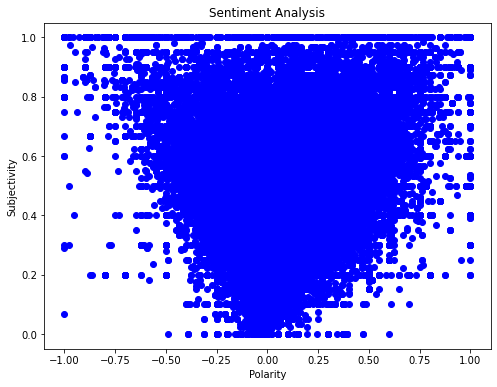

In [51]:
plt.figure(figsize=(8,6))
#for i in range(0,clean_data.shape[0]):
plt.scatter(clean_data['Polarity'],clean_data['Subjectivity'],color='Blue')
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

## Finding percentage of positive and negetive sentiment

In [52]:
# Get  the  percentage of positive tweets...........
ptweets=clean_data[clean_data.Analysis=='Positive']
ptweets=ptweets['text']
round((ptweets.shape[0]/clean_data.shape[0]) *100 , 1)

47.3

In [53]:
# Get  the  percentage of negetive tweets...........
ntweets=clean_data[clean_data.Analysis=='Negative']
ntweets=ntweets['text']
round((ntweets.shape[0]/clean_data.shape[0]) *100 , 1)

17.9

In [54]:
# value counts
clean_data['Analysis'].value_counts()

Positive    70976
Neutral     52199
Negative    26825
Name: Analysis, dtype: int64

## Ploting the Positive ,negative and neutral sentiment

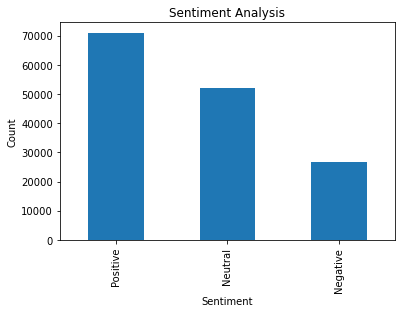

In [55]:
#plot and visualize the counts
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Count')
clean_data['Analysis'].value_counts().plot(kind='bar')
plt.show()

## Add lebel of the data set


In [56]:
# Creat the function to get label of the dataset
def getLabel(Analysis):
    if Analysis== 'Negative':
        return -1
    elif Analysis == 'Positive':
        return 1
    else:
        return 0
clean_data['Label']=clean_data['Analysis'].apply(getLabel)

<ipython-input-56-9ad0f7389fa6>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_data['Label']=clean_data['Analysis'].apply(getLabel)


In [57]:
clean_data.tail()

,text,Subjectivity,Polarity,Analysis,Label
149995,'We're all in this together.' \n\nRoyal Papwor...,0.550000,0.400000,Positive,1
149996,So a coward.... got it!\n\nHappy to sit behi...,0.600000,0.133333,Positive,1
149997,Join us tonight for TheSupernaturalHour prog o...,0.000000,0.000000,Neutral,0
149998,Happy National (virtual) High Five Day! \nnati...,0.770000,0.500000,Positive,1
149999,. proudly shows off his new badge\nToryCrimina...,0.727273,0.468182,Positive,1


In [79]:
#This part is to just see the columns of the dataset:
clean_data.columns

Index(['text', 'Subjectivity', 'Polarity', 'Analysis', 'Label'], dtype='object')

In [80]:
#Here I am making my X value which will then be fitted to scikit learning training test split model
X= clean_data['text'].values
X.shape

(150000,)

In [81]:
#Here I am making my y value:
y = clean_data['Label'].values
y.shape

(150000,)

## Spliting the dataset into training and testing set 

In [82]:
# spliting the dataset into train and test
#from sklearn.model_selection import train_test_split


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)


In [85]:

import numpy
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential